In [1]:
%reload_ext autoreload
%autoreload 2
import os
import multiprocessing as mp
import numpy as np
import geopandas as gpd
import pandas as pd
import pathlib
import matplotlib.pyplot as plt
import seaborn as sns
import cartopy
import plots
import xarray as xr
from shapely.geometry import box
from mann_kenndal import dask_mann_kendall
from utils import createDuckCon, loadTrackingTable, loadSpatialTracking, pixel2area
from dask.distributed import Client, LocalCluster, progress

In [2]:
# Config dataset names
gsmap_name = "GSMaP-MKV v8"
imerg_name = "IMERG Final V07"

# Set path for the tracking table files
gsmap_trackingtable = '/mnt/data/tracks/gsmap_v8_2015-2024/01mmhr_v8/track/grouped/*.parquet'
imerg_trackingtable = '/mnt/data/tracks/imerg_final_v7_2015-2024/01mmhr_v7/track/grouped/*.parquet'

# Set paths for the netcdfs files
gsmap_netcdf_path = '/mnt/data/tracks/gsmap_v8_2015-2024/01mmhr_v8/spatial/'
imerg_netcdf_path = '/mnt/data/tracks/imerg_final_v7_2015-2024/01mmhr_v7/spatial/'

In [3]:
# Create DuckDB connection
con = createDuckCon("/tmp/trends.duckdb")

# client = daskClient(n_workers=35, a_memory=90, temp_folder='/storage/temp/')

# Create Dask client
for v in ["OMP_NUM_THREADS","MKL_NUM_THREADS","OPENBLAS_NUM_THREADS",
          "BLIS_NUM_THREADS","NUMEXPR_NUM_THREADS","NUMBA_NUM_THREADS"]:
    os.environ.setdefault(v, "1")

n_cores = mp.cpu_count() - 1
cluster = LocalCluster(processes=True, n_workers=n_cores, threads_per_worker=1, memory_limit="auto")
client = Client(cluster)
print(client)

def compute(ds):
    ds_persisted = ds.persist()
    futures = client.compute(ds_persisted)
    progress(futures, notebook=False)
    return client.gather(futures)

<Client: 'tcp://127.0.0.1:36281' processes=47 threads=47, memory=123.05 GiB>


In [4]:
# Load spatial tracking data
gsmap_ds_v8 = loadSpatialTracking(gsmap_netcdf_path)
imerg_ds_v7 = loadSpatialTracking(imerg_netcdf_path)

Loading spatial tracking data from: /mnt/data/tracks/gsmap_v8_2015-2024/01mmhr_v8/spatial/
Loading spatial tracking data from: /mnt/data/tracks/imerg_final_v7_2015-2024/01mmhr_v7/spatial/


### Global Maps of trends

In [5]:
gsmap_ds_v8.data_vars.keys()

KeysView(Data variables:
    fam-Non-Continuous  (time, lat, lon) float32 2GB dask.array<chunksize=(1, 1200, 3600), meta=np.ndarray>
    fam-Continuous      (time, lat, lon) float32 2GB dask.array<chunksize=(1, 1200, 3600), meta=np.ndarray>
    clu-NEW             (time, lat, lon) float32 2GB dask.array<chunksize=(1, 1200, 3600), meta=np.ndarray>
    clu-CON             (time, lat, lon) float32 2GB dask.array<chunksize=(1, 1200, 3600), meta=np.ndarray>
    clu-SPL             (time, lat, lon) float32 2GB dask.array<chunksize=(1, 1200, 3600), meta=np.ndarray>
    clu-MRG             (time, lat, lon) float32 2GB dask.array<chunksize=(1, 1200, 3600), meta=np.ndarray>
    clu-NEW-SPL         (time, lat, lon) float32 2GB dask.array<chunksize=(1, 1200, 3600), meta=np.ndarray>
    clu-MRG-SPL         (time, lat, lon) float32 2GB dask.array<chunksize=(1, 1200, 3600), meta=np.ndarray>
    fam-lifetime        (time, lat, lon) float32 2GB dask.array<chunksize=(1, 1200, 3600), meta=np.ndarray>
   

In [6]:
# 1 - Precipitacao dos clusters por mes. (precipitação acumulada / numero de eventos) rain rate
# 2 - Tamanho do cluster por mes (size acumulado / numero eventos)
# 3 - Chuva media do FAM (precipitacao acumulada fam/)
# 4 - Duraao media do fam
# 5 - tamanho medio da fam

In [7]:
pathlib.Path("trends/").mkdir(parents=True, exist_ok=True)

gsmap_ds_v8_cluster_mean_precip = gsmap_ds_v8["clu-values"].chunk({'time': -1, 'lat': 50, 'lon': 50})
# Mean Precipitation of Clusters per Month
if not os.path.exists("trends/gsmap_cluster_mean_precip_trend.nc"):
    
    gsmap_cluster_mean_precip_trend = compute(dask_mann_kendall(gsmap_ds_v8_cluster_mean_precip, test="original", alpha=0.05))
    gsmap_cluster_mean_precip_trend.to_netcdf("trends/gsmap_cluster_mean_precip_trend.nc")
else:
    gsmap_cluster_mean_precip_trend = xr.load_dataset("trends/gsmap_cluster_mean_precip_trend.nc")

imerg_ds_v7_cluster_mean_precip = imerg_ds_v7["clu-values"].chunk({'time': -1, 'lat': 50, 'lon': 50}) * 0.5 # Fix imerg precipitation scaling 
if not os.path.exists("trends/imerg_cluster_mean_precip_trend.nc"):
    imerg_cluster_mean_precip_trend = compute(dask_mann_kendall(imerg_ds_v7_cluster_mean_precip, test="original", alpha=0.05))
    imerg_cluster_mean_precip_trend.to_netcdf("trends/imerg_cluster_mean_precip_trend.nc")
else:
    imerg_cluster_mean_precip_trend = xr.load_dataset("trends/imerg_cluster_mean_precip_trend.nc")

gsmap_mean_precip_pvalue = gsmap_cluster_mean_precip_trend.p.where(gsmap_cluster_mean_precip_trend.p < 0.05)
imerg_mean_precip_pvalue = imerg_cluster_mean_precip_trend.p.where(imerg_cluster_mean_precip_trend.p < 0.05)

Text(0.0, 1.0, 'b) IMERG Final V07 Clusters Precipitation Trend (2015-2024)')

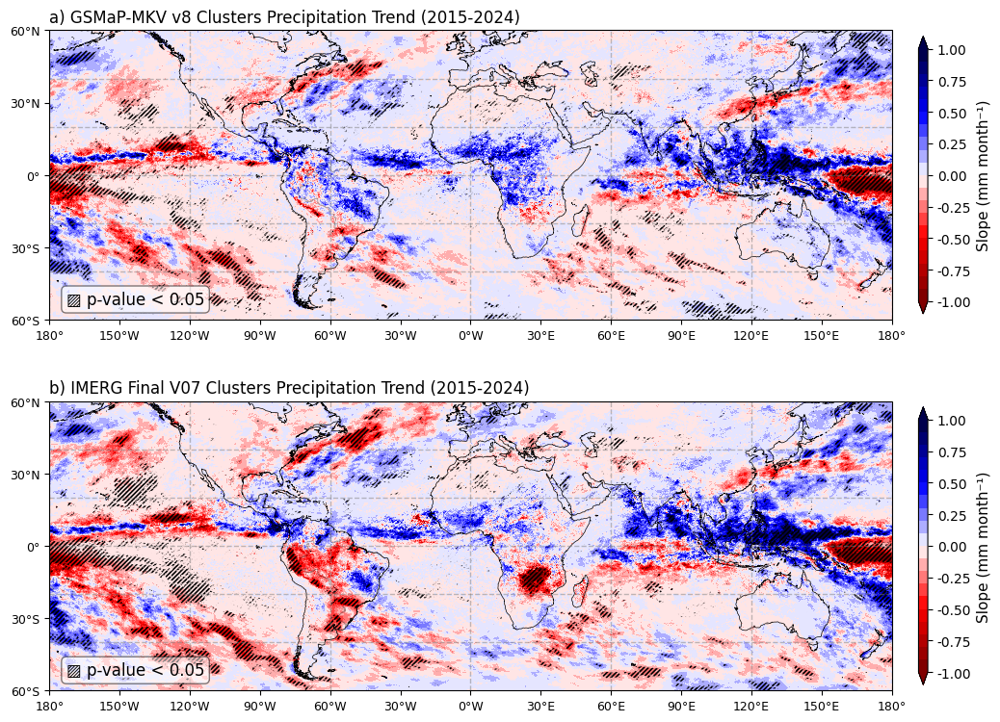

In [8]:
fig, axes = plt.subplots(2, 1, figsize=(12, 10), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.001, 'wspace': 0.13})
plots.map(gsmap_cluster_mean_precip_trend['slope'], sec_array=gsmap_mean_precip_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[0], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (mm month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=1)
plots.map(imerg_cluster_mean_precip_trend['slope'], sec_array=imerg_mean_precip_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[1], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (mm month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=1)
axes[0].set_title(f'a) {gsmap_name} Clusters Precipitation Trend (2015-2024)', loc='left', fontsize=12)
axes[1].set_title(f'b) {imerg_name} Clusters Precipitation Trend (2015-2024)', loc='left', fontsize=12)

In [8]:
def calc_weighted_mean(ds_values, ds_weights):
    ds_cal = []
    for time in ds_values['time']:
        values = ds_values.sel(time=time)  # Select data for the current time
        n_events = ds_weights.sel(time=time) # Select number of occurrences for the current time
        mask_valid = (n_events > 0) & np.isfinite(n_events) # Create mask for valid data
        n_events = n_events.where(mask_valid)  # Apply mask to n_events
        ds_w = (values / n_events) # Calculate weighted values
        ds_cal.append(ds_w) 
    return xr.concat(ds_cal, dim='time')

In [10]:
gsmap_cluster_mean_size = calc_weighted_mean(gsmap_ds_v8['clu-size'], gsmap_ds_v8['clu-density']) 
gsmap_cluster_mean_size = pixel2area(gsmap_cluster_mean_size)  # Convert to km²
if not os.path.exists("trends/gsmap_cluster_mean_size_trend.nc"):
    gsmap_cluster_mean_size = gsmap_cluster_mean_size.chunk({'time': -1, 'lat': 50, 'lon': 50})
    gsmap_cluster_mean_size_trend = compute(dask_mann_kendall(gsmap_cluster_mean_size, test="original", alpha=0.05))
    gsmap_cluster_mean_size_trend.to_netcdf("trends/gsmap_cluster_mean_size_trend.nc")
else:
    gsmap_cluster_mean_size_trend = xr.load_dataset("trends/gsmap_cluster_mean_size_trend.nc")

imerg_cluster_mean_size = calc_weighted_mean(imerg_ds_v7['clu-size'], imerg_ds_v7['clu-density'])
imerg_cluster_mean_size = pixel2area(imerg_cluster_mean_size)  # Convert to km²
if not os.path.exists("trends/imerg_cluster_mean_size_trend.nc"):
    imerg_cluster_mean_size = imerg_cluster_mean_size.chunk({'time': -1, 'lat': 50, 'lon': 50})
    imerg_cluster_mean_size_trend = compute(dask_mann_kendall(imerg_cluster_mean_size, test="original", alpha=0.05))
    imerg_cluster_mean_size_trend.to_netcdf("trends/imerg_cluster_mean_size_trend.nc")
else:
    imerg_cluster_mean_size_trend = xr.load_dataset("trends/imerg_cluster_mean_size_trend.nc")

gsmap_mean_size_pvalue = gsmap_cluster_mean_size_trend.p.where(gsmap_cluster_mean_size_trend.p < 0.05)
imerg_mean_size_pvalue = imerg_cluster_mean_size_trend.p.where(imerg_cluster_mean_size_trend.p < 0.05)

Text(0.0, 1.0, 'd) IMERG Final V07 Clusters Mean Size Trend (2015-2024)')

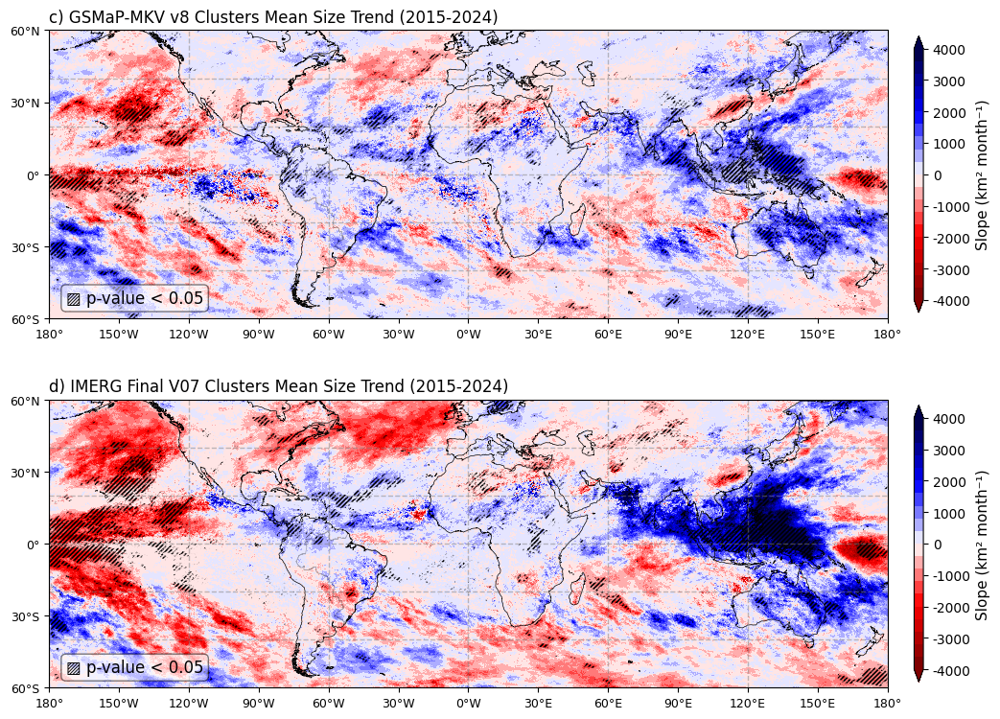

In [11]:
fig, axes = plt.subplots(2, 1, figsize=(12, 10), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.001, 'wspace': 0.13})
plots.map(gsmap_cluster_mean_size_trend['slope'], sec_array=gsmap_mean_size_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[0], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (km² month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, max_val =4000)
plots.map(imerg_cluster_mean_size_trend['slope'], sec_array=imerg_mean_size_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[1], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (km² month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, max_val=4000)
axes[0].set_title(f'c) {gsmap_name} Clusters Mean Size Trend (2015-2024)', loc='left', fontsize=12)
axes[1].set_title(f'd) {imerg_name} Clusters Mean Size Trend (2015-2024)', loc='left', fontsize=12)

In [56]:
# Create GeoDataFrame for Tropical and Extratropical regions
tropics_geom = box(-180, -23.5, 180, 23.5)
extratropics_geom = box(-180, -90, 180, -23.5).union(box(-180, 23.5, 180, 90))
tropics_gdf = gpd.GeoDataFrame({'region': ['Tropics'], 'geometry': [tropics_geom]}, crs='EPSG:4326')
extratropic_gdf = gpd.GeoDataFrame({'region': ['Extratropics'], 'geometry': [extratropics_geom]}, crs='EPSG:4326')

# Create ocean and land masks using cartopy
land_50m = cartopy.feature.NaturalEarthFeature('physical', 'land', '50m')
ocean_50m = cartopy.feature.NaturalEarthFeature('physical', 'ocean', '50m')
land_geom = gpd.GeoDataFrame(geometry=list(land_50m.geometries()), crs='EPSG:4326')
ocean_geom = gpd.GeoDataFrame(geometry=list(ocean_50m.geometries()), crs='EPSG:4326')

In [43]:
# ligue/desligue o uso de máscara de pvalue
USE_MASK = False

def usemask(da, mask, use=USE_MASK):
    return da.where(mask) if use else da

# Gsmap Mean Precipitation
gsmap_mask = ((gsmap_mean_precip_pvalue > 0)).astype(bool)
gsmap_significant_mean_precip = usemask(gsmap_ds_v8_cluster_mean_precip, gsmap_mask)

gsmap_mean_precip_tropics       = compute(gsmap_significant_mean_precip.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(tropics_gdf.geometry, tropics_gdf.crs).mean(dim=("y", "x")))
gsmap_mean_precip_extratropics  = compute(gsmap_significant_mean_precip.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(extratropic_gdf.geometry, extratropic_gdf.crs).mean(dim=("y", "x")))
gsmap_mean_precip_ocean         = compute(gsmap_significant_mean_precip.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(ocean_geom.geometry, ocean_geom.crs).mean(dim=("y", "x")))
gsmap_mean_precip_land          = compute(gsmap_significant_mean_precip.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(land_geom.geometry, land_geom.crs).mean(dim=("y", "x")))

# IMERG Mean Precipitation
imerg_mask = ((imerg_mean_precip_pvalue > 0)).astype(bool)
imerg_significant_mean_precip = usemask(imerg_ds_v7_cluster_mean_precip, imerg_mask)

imerg_mean_precip_tropics       = compute(imerg_significant_mean_precip.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(tropics_gdf.geometry, tropics_gdf.crs).mean(dim=("y", "x")))
imerg_mean_precip_extratropics  = compute(imerg_significant_mean_precip.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(extratropic_gdf.geometry, extratropic_gdf.crs).mean(dim=("y", "x")))
imerg_mean_precip_ocean         = compute(imerg_significant_mean_precip.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(ocean_geom.geometry, ocean_geom.crs).mean(dim=("y", "x")))
imerg_mean_precip_land          = compute(imerg_significant_mean_precip.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(land_geom.geometry, land_geom.crs).mean(dim=("y", "x")))

# Gsmap Mean Size
gsmap_size_mask = ((gsmap_mean_size_pvalue > 0)).astype(bool)
gsmap_significant_mean_size = usemask(gsmap_cluster_mean_size, gsmap_size_mask)

gsmap_mean_size_tropics       = compute(gsmap_significant_mean_size.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(tropics_gdf.geometry, tropics_gdf.crs).mean(dim=("y", "x")))
gsmap_mean_size_extratropics  = compute(gsmap_significant_mean_size.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(extratropic_gdf.geometry, extratropic_gdf.crs).mean(dim=("y", "x")))
gsmap_mean_size_ocean         = compute(gsmap_significant_mean_size.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(ocean_geom.geometry, ocean_geom.crs).mean(dim=("y", "x")))
gsmap_mean_size_land          = compute(gsmap_significant_mean_size.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(land_geom.geometry, land_geom.crs).mean(dim=("y", "x")))

# IMERG Mean Size
imerg_size_mask = ((imerg_mean_size_pvalue > 0)).astype(bool)
imerg_significant_mean_size = usemask(imerg_cluster_mean_size, imerg_size_mask)

imerg_mean_size_tropics       = compute(imerg_significant_mean_size.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(tropics_gdf.geometry, tropics_gdf.crs).mean(dim=("y", "x")))
imerg_mean_size_extratropics  = compute(imerg_significant_mean_size.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(extratropic_gdf.geometry, extratropic_gdf.crs).mean(dim=("y", "x")))
imerg_mean_size_ocean         = compute(imerg_significant_mean_size.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(ocean_geom.geometry, ocean_geom.crs).mean(dim=("y", "x")))
imerg_mean_size_land          = compute(imerg_significant_mean_size.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(land_geom.geometry, land_geom.crs).mean(dim=("y", "x")))

In [44]:
time = gsmap_mean_precip_tropics["time"].values

# --- PRECIP ---
df_precip = pd.DataFrame({
    "time": time,
    "GSMaP_Tropics":        gsmap_mean_precip_tropics.values,
    "GSMaP_Extratropics":   gsmap_mean_precip_extratropics.values,
    "GSMaP_Land":           gsmap_mean_precip_land.values,
    "GSMaP_Ocean":          gsmap_mean_precip_ocean.values,
    "IMERG_Tropics":        imerg_mean_precip_tropics.values,
    "IMERG_Extratropics":   imerg_mean_precip_extratropics.values,
    "IMERG_Land":           imerg_mean_precip_land.values,
    "IMERG_Ocean":          imerg_mean_precip_ocean.values,
})
df_long_precip = df_precip.melt(id_vars="time", var_name="Dataset_Region", value_name="Precip")

# --- SIZE ---
df_size = pd.DataFrame({
    "time": time,
    "GSMaP_Tropics":        gsmap_mean_size_tropics.values,
    "GSMaP_Extratropics":   gsmap_mean_size_extratropics.values,
    "GSMaP_Land":           gsmap_mean_size_land.values,
    "GSMaP_Ocean":          gsmap_mean_size_ocean.values,
    "IMERG_Tropics":        imerg_mean_size_tropics.values,
    "IMERG_Extratropics":   imerg_mean_size_extratropics.values,
    "IMERG_Land":           imerg_mean_size_land.values,
    "IMERG_Ocean":          imerg_mean_size_ocean.values,
})
df_long_size = df_size.melt(id_vars="time", var_name="Dataset_Region", value_name="Size")

def split_cols(df, col="Dataset_Region"):
    out = df.copy()
    out[["Dataset", "Region"]] = out[col].str.split("_", n=1, expand=True)
    return out

df_plot_p = split_cols(df_long_precip)
df_plot_s = split_cols(df_long_size)

region_order = ["Tropics", "Extratropics", "Land", "Ocean"]
for _df in (df_plot_p, df_plot_s):
    _df["Region"] = pd.Categorical(_df["Region"], categories=region_order, ordered=True)

df_plot_p = df_plot_p.sort_values(["Region", "time"])
df_plot_s = df_plot_s.sort_values(["Region", "time"])

In [45]:
def mk_slope_intercept_from_df(group, value_col="Precip", time_col="time", time_coord_name="time"):
    t = pd.to_datetime(group[time_col].to_numpy())
    order = np.argsort(t)
    t = t[order]
    y = group[value_col].to_numpy()[order]
    da = xr.DataArray(y, coords={time_coord_name: t}, dims=[time_coord_name], name=value_col)
    trend = dask_mann_kendall(da, test="original", alpha=0.05, time_coord=time_coord_name).compute()
    return float(trend["slope"]), float(trend["intercept"])

# PRECIP
rows_p = []
for (ds, rg), g in df_plot_p.groupby(["Dataset", "Region"]):
    s, b = mk_slope_intercept_from_df(g, value_col="Precip")
    rows_p.append({"Dataset": ds, "Region": rg, "slope": s, "intercept": b})
trend_precip = pd.DataFrame(rows_p)

# SIZE
rows_s = []
for (ds, rg), g in df_plot_s.groupby(["Dataset", "Region"]):
    s, b = mk_slope_intercept_from_df(g, value_col="Size")
    rows_s.append({"Dataset": ds, "Region": rg, "slope": s, "intercept": b})
trend_size = pd.DataFrame(rows_s)

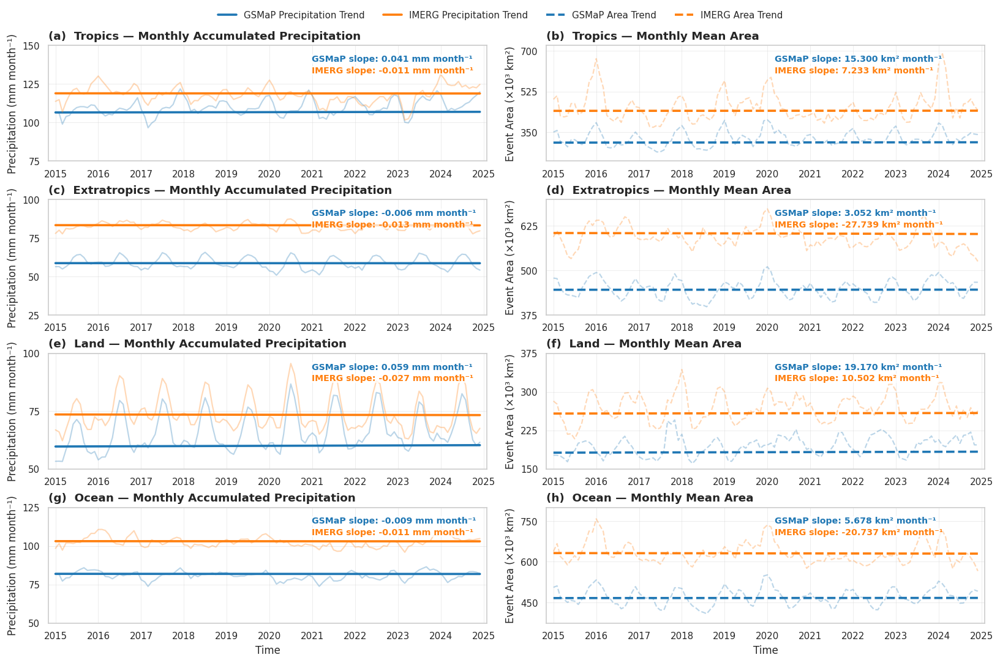

In [46]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mticker

# -------------------- Estilo global --------------------
sns.set_theme(style="whitegrid", context="paper")
plt.rcParams.update({
    "figure.dpi": 120,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
})

COLOR_DS  = {"GSMaP": "#1f77b4", "IMERG": "#ff7f0e"}
region_order = ["Tropics", "Extratropics", "Land", "Ocean"]
panel_tags   = ["(a)","(b)","(c)","(d)","(e)","(f)","(g)","(h)"]

PRECIP_KW = dict(linewidth=2.2, alpha=1.0, linestyle="-")
SIZE_KW   = dict(linewidth=2.2, alpha=1.0, linestyle="--")

def fmt_slope(v):
    try:
        return f"{np.sign(v) * abs(v):.3f}"
    except Exception:
        return "n/a"

def set_time_axis(ax, xmin, xmax):
    ax.set_xlim(xmin - pd.Timedelta(days=60), xmax + pd.Timedelta(days=60))
    ax.xaxis.set_major_locator(mdates.YearLocator(base=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
    ax.grid(True, linewidth=0.6, alpha=0.35)

def set_four_yticks(ax, base=25):
    ymin, ymax = ax.get_ylim()
    # arredonda para baixo e para cima em múltiplos de `base`
    ymin_rounded = np.floor(ymin / base) * base
    ymax_rounded = np.ceil(ymax / base) * base
    ax.set_ylim(ymin_rounded, ymax_rounded)
    # cria até 4 marcas inteiras múltiplas de `base`
    locator = mticker.MultipleLocator(base)
    ax.yaxis.set_major_locator(locator)
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter("%d"))
    # força no máximo 4 ticks ajustando o "step" dinamicamente, se necessário
    yticks = np.arange(ymin_rounded, ymax_rounded + base, base)
    if len(yticks) > 4:
        step = int(np.ceil((ymax_rounded - ymin_rounded) / 3 / base)) * base
        locator = mticker.MultipleLocator(step)
        ax.yaxis.set_major_locator(locator)

def rolling_smooth(df, by_col, value_col, win=3):
    df = df.copy()
    df["smooth"] = (
        df.groupby(by_col)[value_col]
          .transform(lambda s: s.rolling(win, center=True, min_periods=1).mean())
    )
    return df

def add_trend(ax, t, row, color, style_kw, scale=1.0):
    # t: Series datetime; slope/intercept assumem x em anos
    dt_years = (t - t.iloc[0]).dt.total_seconds() / (365.25 * 24 * 3600)
    y = (row["intercept"] + row["slope"] * dt_years.values) / scale
    ax.plot(t, y, color=color, **style_kw)

def slope_label(ax, x, y, text, color):
    ax.text(x, y, text, transform=ax.transAxes, ha="left", va="top",
            fontsize=8.5, color=color, fontweight="bold",
            bbox=dict(facecolor="white", edgecolor="none", alpha=0.75, pad=0.25))
# -------------------- Configuração por métrica --------------------
METRICS = [
    dict(                           # coluna esquerda: Precipitação
        title_suffix="— Monthly Accumulated Precipitation",
        y="Precip",                 # coluna do valor bruto
        ylabel="Precipitation (mm month⁻¹)",
        trend_df_name="trend_precip",
        style_kw=PRECIP_KW,
        smooth_scale=1.0,           # sem reescala no traço suavizado
        trend_scale=1.0,            # sem reescala na reta
        line_ls="-",
        label_fmt=lambda row: f"{fmt_slope(row['slope'])} mm month⁻¹",
        label_xy=(0.60, { "GSMaP":0.92, "IMERG":0.82 }),
    ),
    dict(                           # coluna direita: Área dos eventos
        title_suffix="— Monthly Mean Area",
        y="Size",
        ylabel="Event Area (×10³ km²)",
        trend_df_name="trend_size",
        style_kw=SIZE_KW,
        smooth_scale=1_000.0,       # mostrar série em milhares
        trend_scale=1_000.0,        # reta também em milhares
        line_ls="--",
        # No seu código havia divisão por 10 no rótulo; mantenho a mesma convenção:
        label_fmt=lambda row: f"{fmt_slope(row['slope']/10)} km² month⁻¹",
        label_xy=(0.52, { "GSMaP":0.92, "IMERG":0.82 }),
    ),
]
# -------------------- Pré-cálculos de tempo --------------------
all_time = pd.to_datetime(df_plot_p["time"])
xmin, xmax = all_time.min(), all_time.max()
# -------------------- Figura --------------------
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(13.5, 8.6),
                         constrained_layout=True, sharex=False)
k = 0
for i, region in enumerate(region_order):
    # duas colunas: 0 = precip, 1 = size
    for j, cfg in enumerate(METRICS):
        ax = axes[i, j]
        # Seleção e suavização
        df_src   = df_plot_p if cfg["y"] == "Precip" else df_plot_s
        sub      = rolling_smooth(df_src[df_src["Region"] == region], "Dataset", cfg["y"])
        y_smooth = "smooth"
        scale    = cfg["smooth_scale"]
        # Traços suavizados por dataset
        for ds in ["GSMaP", "IMERG"]:
            g = sub[sub["Dataset"] == ds].sort_values("time")
            t = pd.to_datetime(g["time"])
            ax.plot(t.values, (g[y_smooth].values / scale),
                    color=COLOR_DS[ds], linewidth=1.3, alpha=0.30, linestyle=cfg["line_ls"])
            # Reta de tendência
            trend_df = globals()[cfg["trend_df_name"]]
            row = trend_df[(trend_df["Dataset"] == ds) & (trend_df["Region"] == region)].iloc[0]
            add_trend(ax, t, row, COLOR_DS[ds], cfg["style_kw"], scale=cfg["trend_scale"])
            # Rótulo da inclinação (posições por dataset)
            x_txt, y_map = cfg["label_xy"]
            slope_label(ax, x_txt, y_map[ds], f"{ds} slope: {cfg['label_fmt'](row)}", COLOR_DS[ds])
        # Eixos e títulos
        set_time_axis(ax, xmin, xmax)
        set_four_yticks(ax)
        ax.set_ylabel(cfg["ylabel"])
        ax.set_title(f"{panel_tags[k]}  {region} {cfg['title_suffix']}",
                     loc="left", fontsize=11, fontweight="bold")
        k += 1
# Rótulos de tempo apenas na última linha
for ax in axes[-1, :]:
    ax.set_xlabel("Time")
# Set ylimits of all first columns
# for ax in axes[:, 0]:
#     ax.set_ylim(50, 125)  # start y-axis at 0

handles = [
    plt.Line2D([0], [0], color=COLOR_DS["GSMaP"], lw=PRECIP_KW["linewidth"], ls="-",  label="GSMaP Precipitation Trend"),
    plt.Line2D([0], [0], color=COLOR_DS["IMERG"], lw=PRECIP_KW["linewidth"], ls="-",  label="IMERG Precipitation Trend"),
    plt.Line2D([0], [0], color=COLOR_DS["GSMaP"], lw=SIZE_KW["linewidth"],   ls="--", label="GSMaP Area Trend"),
    plt.Line2D([0], [0], color=COLOR_DS["IMERG"], lw=SIZE_KW["linewidth"],   ls="--", label="IMERG Area Trend"),
]
fig.legend(handles=handles, loc="upper center", ncol=4, frameon=False, bbox_to_anchor=(0.5, 1.04))
plt.show()

In [ ]:
# 3 - Chuva media do FAM (precipitacao acumulada fam/)
# 4 - Duraao media do fam
# 5 - tamanho medio da fam

In [5]:
# Max Precipitation of FAM per Month
gsmap_ds_v8_fam_max_precip = gsmap_ds_v8.chunk({'time': -1, 'lat': 50, 'lon': 50})['fam-max_values']
imerg_ds_v7_fam_max_precip = imerg_ds_v7.chunk({'time': -1, 'lat': 50, 'lon': 50})['fam-max_values'] # Fix imerg precipitation scaling

if not os.path.exists("trends/gsmap_fam_max_precip_trend.nc"):
    gsmap_fam_max_precip_trend = compute(dask_mann_kendall(gsmap_ds_v8_fam_max_precip, test="original", alpha=0.05))
    gsmap_fam_max_precip_trend.to_netcdf("trends/gsmap_fam_max_precip_trend.nc")
else:
    gsmap_fam_max_precip_trend = xr.load_dataset("trends/gsmap_fam_max_precip_trend.nc")
if not os.path.exists("trends/imerg_fam_max_precip_trend.nc"):
    imerg_fam_max_precip_trend = compute(dask_mann_kendall(imerg_ds_v7_fam_max_precip, test="original", alpha=0.05))
    imerg_fam_max_precip_trend.to_netcdf("trends/imerg_fam_max_precip_trend.nc")
else:
    imerg_fam_max_precip_trend = xr.load_dataset("trends/imerg_fam_max_precip_trend.nc")

gsmap_fam_max_precip_pvalue = gsmap_fam_max_precip_trend.p.where(gsmap_fam_max_precip_trend.p < 0.05)
imerg_fam_max_precip_pvalue = imerg_fam_max_precip_trend.p.where(imerg_fam_max_precip_trend.p < 0.05)

Text(0.0, 1.0, 'b) IMERG Final V07 FAM Max Precipitation Trend (2015-2024)')

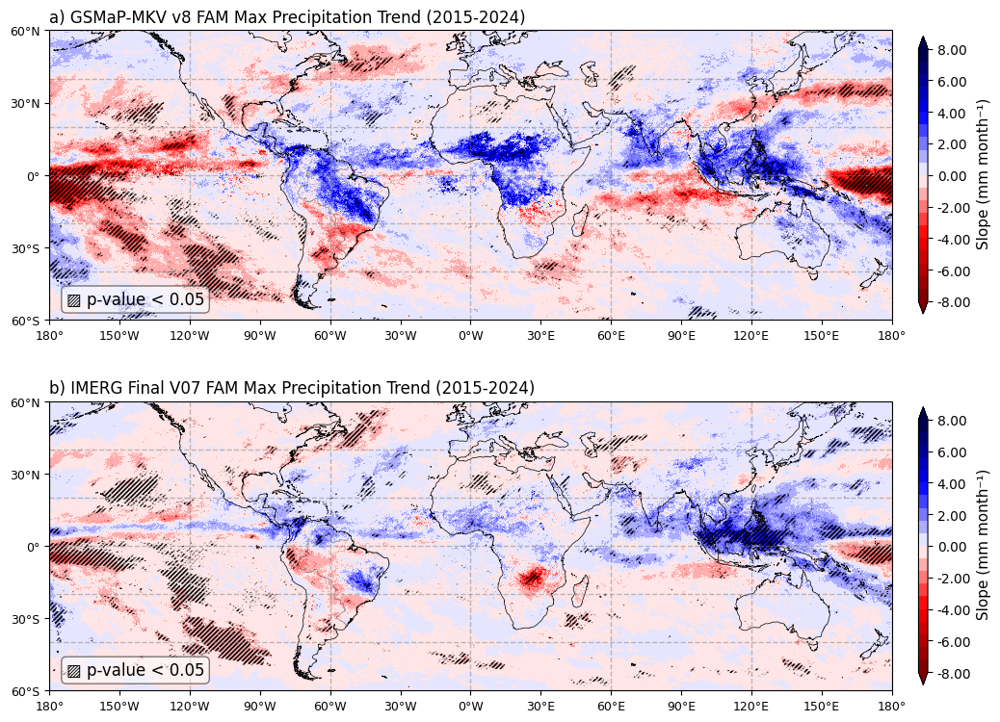

In [12]:
fig, axes = plt.subplots(2, 1, figsize=(12, 10), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.001, 'wspace': 0.13})
plots.map(gsmap_fam_max_precip_trend['slope'], sec_array=gsmap_fam_max_precip_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[0], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label=' Slope (mm month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=8, min_val=-8)
plots.map(imerg_fam_max_precip_trend['slope'], sec_array=imerg_fam_max_precip_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[1], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label=' Slope (mm month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=8, min_val=-8)
axes[0].set_title(f'a) {gsmap_name} FAM Max Precipitation Trend (2015-2024)', loc='left', fontsize=12)
axes[1].set_title(f'b) {imerg_name} FAM Max Precipitation Trend (2015-2024)', loc='left', fontsize=12)

In [6]:
# Mean Precipitation of FAM per Month
gsmap_ds_v8_fam_mean_precip = gsmap_ds_v8.chunk({'time': -1, 'lat': 50, 'lon': 50})['fam-mean_values']
imerg_ds_v7_fam_mean_precip = imerg_ds_v7.chunk({'time': -1, 'lat': 50, 'lon': 50})['fam-mean_values']

if not os.path.exists("trends/gsmap_fam_mean_precip_trend.nc"):
    gsmap_fam_mean_precip_trend = compute(dask_mann_kendall(gsmap_ds_v8_fam_mean_precip, test="original", alpha=0.05))
    gsmap_fam_mean_precip_trend.to_netcdf("trends/gsmap_fam_mean_precip_trend.nc")
else:
    gsmap_fam_mean_precip_trend = xr.load_dataset("trends/gsmap_fam_mean_precip_trend.nc")
if not os.path.exists("trends/imerg_fam_mean_precip_trend.nc"):
    imerg_fam_mean_precip_trend = compute(dask_mann_kendall(imerg_ds_v7_fam_mean_precip, test="original", alpha=0.05))
    imerg_fam_mean_precip_trend.to_netcdf("trends/imerg_fam_mean_precip_trend.nc")
else:
    imerg_fam_mean_precip_trend = xr.load_dataset("trends/imerg_fam_mean_precip_trend.nc")

gsmap_fam_mean_precip_pvalue = gsmap_fam_mean_precip_trend.p.where(gsmap_fam_mean_precip_trend.p < 0.05)
imerg_fam_mean_precip_pvalue = imerg_fam_mean_precip_trend.p.where(imerg_fam_mean_precip_trend.p < 0.05)

Text(0.0, 1.0, 'b) IMERG Final V07 PS Mean Precipitation Trend (2015-2024)')

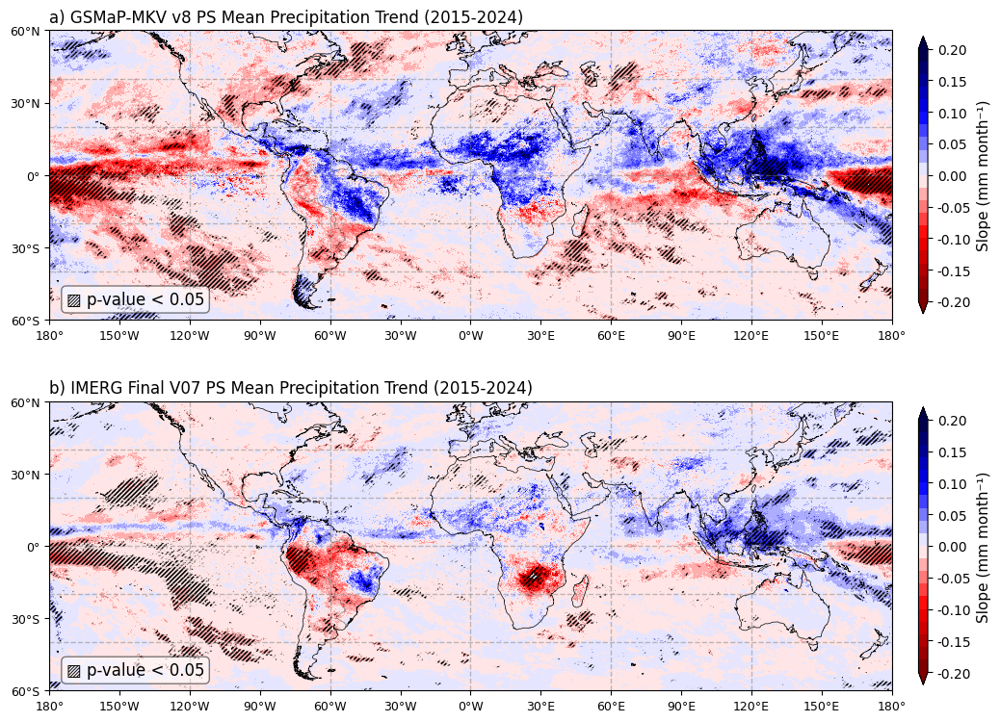

In [30]:
fig, axes = plt.subplots(2, 1, figsize=(12, 10), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.001, 'wspace': 0.13})
plots.map(gsmap_fam_mean_precip_trend['slope'], sec_array=gsmap_fam_mean_precip_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[0], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (mm month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f',max_val=0.2, min_val=-0.2)
plots.map(imerg_fam_mean_precip_trend['slope'], sec_array=imerg_fam_mean_precip_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[1], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (mm month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=0.2, min_val=-0.2)
axes[0].set_title(f'a) {gsmap_name} PS Mean Precipitation Trend (2015-2024)', loc='left', fontsize=12)
axes[1].set_title(f'b) {imerg_name} PS Mean Precipitation Trend (2015-2024)', loc='left', fontsize=12)

In [9]:
# Mean Duration of FAM per Month
gsmap_ds_v8_fam_mean_duration = calc_weighted_mean(gsmap_ds_v8['fam-duration'], gsmap_ds_v8['fam-density'])
gsmap_ds_v8_fam_mean_duration = gsmap_ds_v8_fam_mean_duration.chunk({'time': -1, 'lat': 50, 'lon': 50})
imerg_ds_v7_fam_mean_duration = calc_weighted_mean(imerg_ds_v7['fam-duration'], imerg_ds_v7['fam-density'])
imerg_ds_v7_fam_mean_duration = imerg_ds_v7_fam_mean_duration.chunk({'time': -1, 'lat': 50, 'lon': 50})

if not os.path.exists("trends/gsmap_fam_mean_duration_trend.nc"):
    gsmap_fam_mean_duration_trend = compute(dask_mann_kendall(gsmap_ds_v8_fam_mean_duration, test="original", alpha=0.05))
    gsmap_fam_mean_duration_trend.to_netcdf("trends/gsmap_fam_mean_duration_trend.nc")
else:
    gsmap_fam_mean_duration_trend = xr.load_dataset("trends/gsmap_fam_mean_duration_trend.nc")
if not os.path.exists("trends/imerg_fam_mean_duration_trend.nc"):
    imerg_fam_mean_duration_trend = compute(dask_mann_kendall(imerg_ds_v7_fam_mean_duration, test="original", alpha=0.05))
    imerg_fam_mean_duration_trend.to_netcdf("trends/imerg_fam_mean_duration_trend.nc")
else:
    imerg_fam_mean_duration_trend = xr.load_dataset("trends/imerg_fam_mean_duration_trend.nc")

gsmap_fam_mean_duration_pvalue = gsmap_fam_mean_duration_trend.p.where(gsmap_fam_mean_duration_trend.p < 0.05)
imerg_fam_mean_duration_pvalue = imerg_fam_mean_duration_trend.p.where(imerg_fam_mean_duration_trend.p < 0.05)

Text(0.0, 1.0, 'd) IMERG Final V07 PS Mean Duration Trend (2015-2024)')

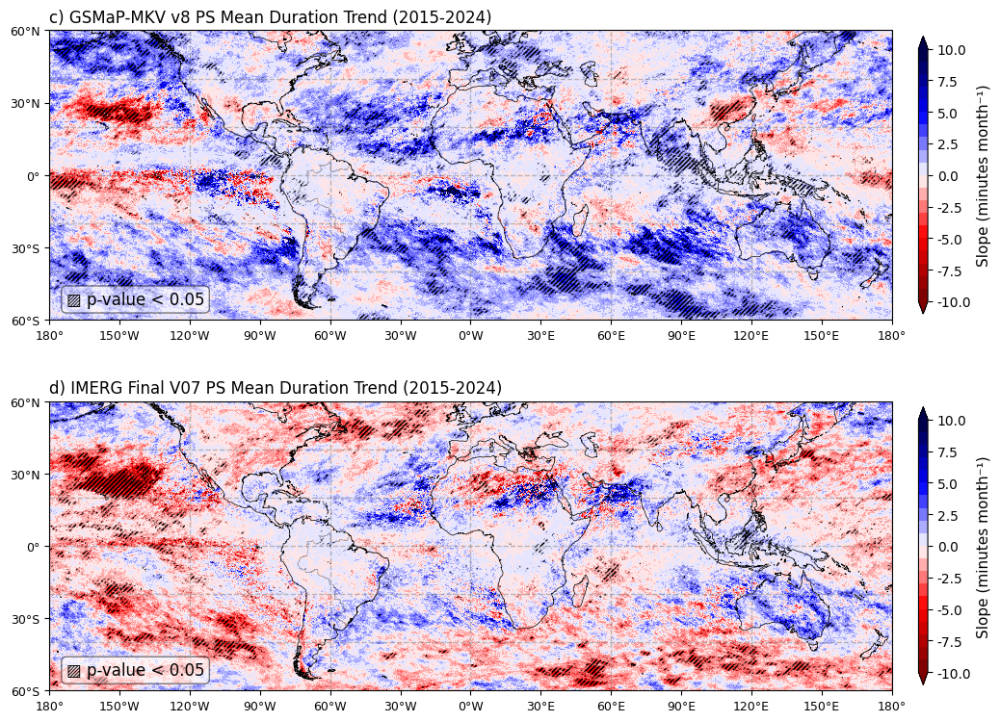

In [49]:
fig, axes = plt.subplots(2, 1, figsize=(12, 10), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.001, 'wspace': 0.13})
plots.map(gsmap_fam_mean_duration_trend['slope'], sec_array=gsmap_fam_mean_duration_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[0], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (minutes month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.1f', max_val=10, min_val=-10)
plots.map(imerg_fam_mean_duration_trend['slope'],  sec_array=imerg_fam_mean_duration_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[1], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (minutes month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.1f', max_val=10, min_val=-10)
axes[0].set_title(f'c) {gsmap_name} PS Mean Duration Trend (2015-2024)', loc='left', fontsize=12)
axes[1].set_title(f'd) {imerg_name} PS Mean Duration Trend (2015-2024)', loc='left', fontsize=12)

In [10]:
# Mean Size of FAM per Month
gsmap_ds_v8_fam_mean_size = calc_weighted_mean(gsmap_ds_v8['fam-size'], gsmap_ds_v8['fam-density'])
gsmap_ds_v8_fam_mean_size = pixel2area(gsmap_ds_v8_fam_mean_size)  # Convert to km²
gsmap_ds_v8_fam_mean_size = gsmap_ds_v8_fam_mean_size.chunk({'time': -1, 'lat': 50, 'lon': 50})
imerg_ds_v7_fam_mean_size = calc_weighted_mean(imerg_ds_v7['fam-size'], imerg_ds_v7['fam-density'])
imerg_ds_v7_fam_mean_size = pixel2area(imerg_ds_v7_fam_mean_size)  # Convert to km²
imerg_ds_v7_fam_mean_size = imerg_ds_v7_fam_mean_size.chunk({'time': -1, 'lat': 50, 'lon': 50})

if not os.path.exists("trends/gsmap_fam_mean_size_trend.nc"):
    gsmap_fam_mean_size_trend = compute(dask_mann_kendall(gsmap_ds_v8_fam_mean_size, test="original", alpha=0.05))
    gsmap_fam_mean_size_trend.to_netcdf("trends/gsmap_fam_mean_size_trend.nc")
else:
    gsmap_fam_mean_size_trend = xr.load_dataset("trends/gsmap_fam_mean_size_trend.nc")
if not os.path.exists("trends/imerg_fam_mean_size_trend.nc"):
    imerg_fam_mean_size_trend = compute(dask_mann_kendall(imerg_ds_v7_fam_mean_size, test="original", alpha=0.05))
    imerg_fam_mean_size_trend.to_netcdf("trends/imerg_fam_mean_size_trend.nc")
else:
    imerg_fam_mean_size_trend = xr.load_dataset("trends/imerg_fam_mean_size_trend.nc")

gsmap_fam_mean_size_pvalue = gsmap_fam_mean_size_trend.p.where(gsmap_fam_mean_size_trend.p < 0.05)
imerg_fam_mean_size_pvalue = imerg_fam_mean_size_trend.p.where(imerg_fam_mean_size_trend.p < 0.05)

Text(0.0, 1.0, 'f) IMERG Final V07 PS Mean Area Trend (2015-2024)')

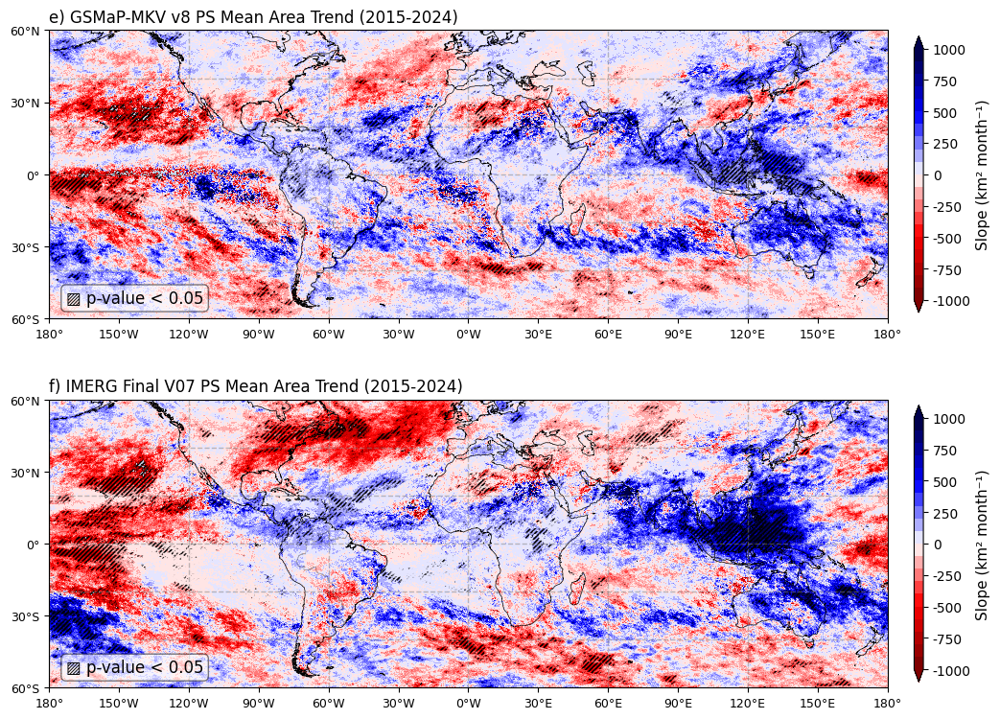

In [59]:
fig, axes = plt.subplots(2, 1, figsize=(12, 10), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.001, 'wspace': 0.13})
plots.map(gsmap_fam_mean_size_trend['slope'], sec_array=gsmap_fam_mean_size_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[0], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (km² month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, max_val=1000, min_val=-1000)
plots.map(imerg_fam_mean_size_trend['slope'], sec_array=imerg_fam_mean_size_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[1], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (km² month⁻¹)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75,  max_val=1000, min_val=-1000)
axes[0].set_title(f'e) {gsmap_name} PS Mean Area Trend (2015-2024)', loc='left', fontsize=12)
axes[1].set_title(f'f) {imerg_name} PS Mean Area Trend (2015-2024)', loc='left', fontsize=12)

In [ ]:
def classify_and_agreement(ds1: xr.Dataset,ds2: xr.Dataset,var: str,threshold: float = 0.01):
    # Garante alinhamento em coordenadas
    da1, da2 = xr.align(ds1[var], ds2[var])
    # Função auxiliar de classificação
    def _classify(da):
        # -1: negativo, 0: nulo, +1: positivo
        return xr.where(
            da > threshold,
            1,
            xr.where(da < -threshold, -1, 0)
        ).astype("int8")

    da1_class = _classify(da1)
    da2_class = _classify(da2)
    # Máscara de dados válidos (sem NaN em nenhum dos dois)
    valid = da1.notnull() & da2.notnull()
    # Concordância: classes iguais e ambos válidos
    agreement = ((da1_class == da2_class) & valid).astype("int8")
    # % de concordância
    n_valid = valid.sum()
    n_agree = agreement.sum()
    agreement_pct = (n_agree / n_valid * 100).item() if n_valid > 0 else np.nan

    out = xr.Dataset(
        {
            f"{var}1_class": da1_class,
            f"{var}2_class": da2_class,
            "agreement": agreement,
        }
    )
    # Escalar 0D em xarray
    out["agreement_pct"] = xr.DataArray(agreement_pct)
    return out


In [43]:
fam_mean_precip_diverg = classify_and_agreement(imerg_fam_mean_precip_trend, gsmap_fam_mean_precip_trend, var='slope', threshold=0.01)
fam_mean_size_diverg   = classify_and_agreement(imerg_fam_mean_size_trend,   gsmap_fam_mean_size_trend,   var='slope', threshold=10.0)
fam_mean_duration_diverg = classify_and_agreement(imerg_fam_mean_duration_trend, gsmap_fam_mean_duration_trend, var='slope', threshold=0.1)

Text(0.0, 1.0, 'c) FAM Mean Duration Trend Agreement (2015-2024) — Threshold: 0.1 — Agreement: 47.60 %')

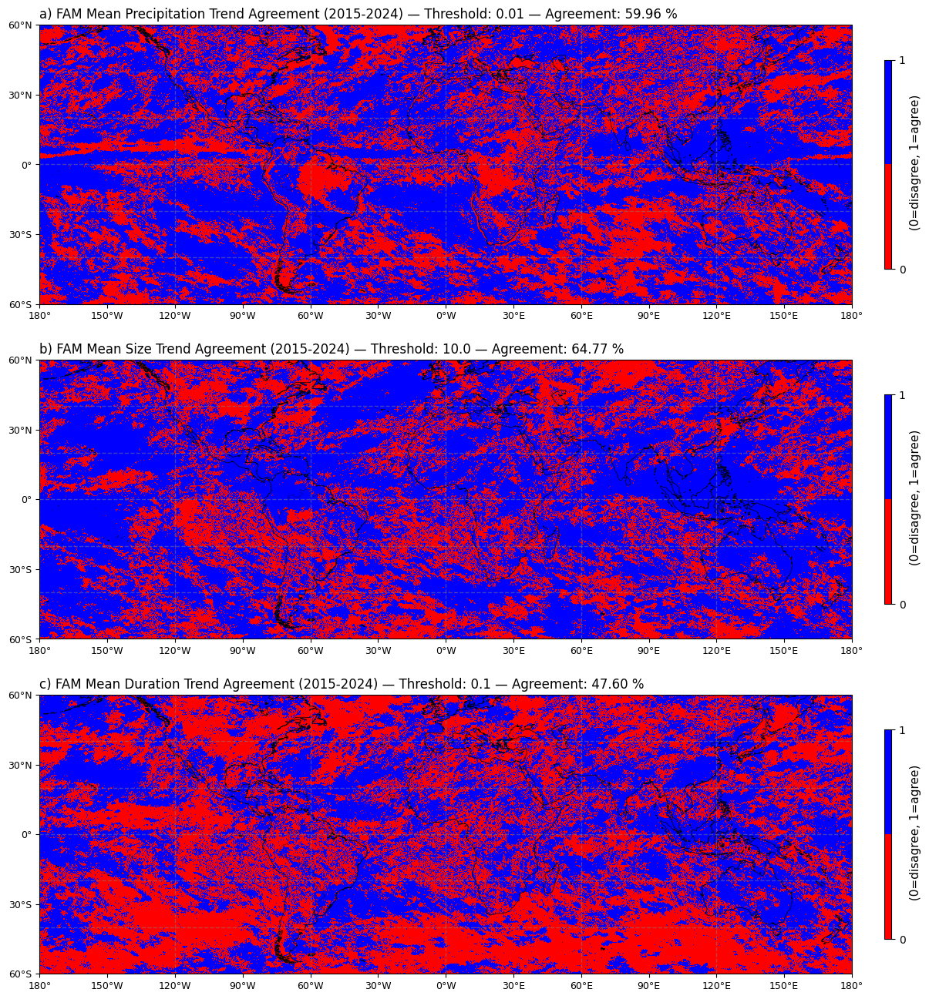

In [49]:
fig, axes = plt.subplots(3, 1, figsize=(18, 16), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.2, 'wspace': 0.13})
plots.map(fam_mean_precip_diverg['agreement'], sec_title='▨ Agreement', figsize=(16, 12), ax=axes[0], title='', ylim=[-60, 60], cmap_num=2, cmap='bwr_r',
cbar_label=' (0=disagree, 1=agree)', cbar_extend='neither', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%d', max_val=1, min_val=0, cbar_ticks=[0,1])
plots.map(fam_mean_size_diverg['agreement'], sec_title='▨ Agreement', figsize=(16, 12), ax=axes[1], title='', ylim=[-60, 60], cmap_num=2, cmap='bwr_r',
cbar_label=' (0=disagree, 1=agree)', cbar_extend='neither', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%d', max_val=1, min_val=0, cbar_ticks=[0,1])
plots.map(fam_mean_duration_diverg['agreement'], sec_title='▨ Agreement', figsize=(16, 12), ax=axes[2], title='', ylim=[-60, 60], cmap_num=2, cmap='bwr_r',
cbar_label=' (0=disagree, 1=agree)', cbar_extend='neither', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%d', max_val=1, min_val=0, cbar_ticks=[0,1])
axes[0].set_title(f'a) FAM Mean Precipitation Trend Agreement (2015-2024) — Threshold: {0.01} — Agreement: {fam_mean_precip_diverg["agreement_pct"].item():.2f} %', loc='left', fontsize=12)
axes[1].set_title(f'b) FAM Mean Size Trend Agreement (2015-2024) — Threshold: {10.0} — Agreement: {fam_mean_size_diverg["agreement_pct"].item():.2f} %', loc='left', fontsize=12)
axes[2].set_title(f'c) FAM Mean Duration Trend Agreement (2015-2024) — Threshold: {0.1} — Agreement: {fam_mean_duration_diverg["agreement_pct"].item():.2f} %', loc='left', fontsize=12)

In [57]:
# -*- coding: utf-8 -*-
# Time-series atlas por classes (Tropics/Extratropics × Land/Ocean) — GSMaP vs IMERG
# Requer: numpy, xarray, geopandas, rasterio, shapely, matplotlib, cartopy (já está no seu ambiente)

import numpy as np
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt
from rasterio.features import rasterize
from rasterio.transform import from_bounds

# =======================
# PARÂMETROS AJUSTÁVEIS
# =======================
USE_ANOMALIES   = False   # True: remove ciclo anual (anomalias) antes de agregação
SMOOTH_WINDOW   = 3       # meses para média móvel (None para não suavizar)
LABELS_COLS     = ["Mean Precipitation", "Mean Duration", "Mean Area"]
COLOR_GSMAP     = "#1f77b4"
COLOR_IMERG     = "#ff7f0e"
LINW            = 1.8
CHUNKS          = {'time': 120, 'lat': 200, 'lon': 300}

# =======================
# FUNÇÕES AUXILIARES
# =======================
def to_float32(*das):
    return [da.astype('float32', copy=False) for da in das]

def deseasonalize(da: xr.DataArray, time_name="time") -> xr.DataArray:
    clim = da.groupby(f"{time_name}.month").mean(time_name, skipna=True)
    return da.groupby(f"{time_name}.month") - clim

def smooth_series(da_ts: xr.DataArray, win: int) -> xr.DataArray:
    if win and win > 1:
        return da_ts.rolling(time=win, center=True, min_periods=max(1, win//2)).mean()
    return da_ts

def build_affine(lon: xr.DataArray, lat: xr.DataArray):
    """Affine transform para rasterizar gdf em grade lat/lon de xarray."""
    left, right = float(lon.min()), float(lon.max())
    bottom, top = float(lat.min()), float(lat.max())
    ncols, nrows = lon.size, lat.size
    # atenção: lat decresce usualmente (60→-60); transform assume linha 0 no topo
    # Usamos bounds corretos, rasterize cuida da orientação por linhas/colunas
    transform = from_bounds(left, bottom, right, top, ncols, nrows)
    return transform

def rasterize_gdf_to_mask(gdf: gpd.GeoDataFrame, lon: xr.DataArray, lat: xr.DataArray) -> xr.DataArray:
    """
    Rasteriza o GeoDataFrame para a grade (lat, lon). Retorna máscara booleana (lat×lon).
    """
    transform = build_affine(lon, lat)
    shapes = [(geom, 1) for geom in gdf.geometry.values if geom is not None]
    mask_arr = rasterize(
        shapes,
        out_shape=(lat.size, lon.size),
        transform=transform,
        fill=0,
        dtype='uint8'
    )
    # Se a sua coord lat está em ordem decrescente, precisamos alinhar linhas:
    # rasterize gera linha 0 = topo (lat_max). Se lat for decrescente, ok.
    # Se lat for crescente, invertimos:
    if (np.diff(lat.values) > 0).all():  # crescente
        mask_arr = mask_arr[::-1, :]
    da_mask = xr.DataArray(mask_arr.astype(bool), coords={'lat': lat, 'lon': lon}, dims=('lat', 'lon'))
    return da_mask

def area_weighted_mean(da: xr.DataArray, mask: xr.DataArray) -> xr.DataArray:
    """Média ponderada por cos(lat) em (lat, lon) com máscara booleana."""
    lat = da['lat']
    w_lat = np.cos(np.deg2rad(lat)).astype('float32')
    w = xr.ones_like(da, dtype='float32') * w_lat
    da_m = da.where(mask)
    w_m  = w.where(mask)
    num = (da_m * w_m).sum(dim=('lat', 'lon'), skipna=True)
    den = w_m.sum(dim=('lat', 'lon'), skipna=True)
    return num / den

def regional_series(da: xr.DataArray, masks: dict, anomalies=False, smooth_win=SMOOTH_WINDOW) -> dict:
    """
    Calcula séries regionais para cada máscara.
    Retorna dict {region_name: series (time)}.
    """
    x = deseasonalize(da) if anomalies else da
    out = {}
    for name, m in masks.items():
        ts = area_weighted_mean(x, m)
        ts = smooth_series(ts, smooth_win)
        out[name] = ts
    return out

# =======================
# MÁSCARAS (a partir dos GDFs que você já tem)
# =======================
# Espera-se que você JÁ tenha criado:
# tropics_gdf, extratropic_gdf, land_geom, ocean_geom  (crs='EPSG:4326')

def build_all_masks(sample_da: xr.DataArray) -> dict:
    lon = sample_da['lon']; lat = sample_da['lat']
    # rasteriza
    mask_trop = rasterize_gdf_to_mask(tropics_gdf,      lon, lat)
    mask_ext  = rasterize_gdf_to_mask(extratropic_gdf,  lon, lat)
    mask_land = rasterize_gdf_to_mask(land_geom,        lon, lat)
    mask_ocn  = rasterize_gdf_to_mask(ocean_geom,       lon, lat)
    # combinações
    masks = {
        "Tropics – Land":        (mask_trop & mask_land),
        "Tropics – Ocean":       (mask_trop & mask_ocn),
        "Extratropics – Land":   (mask_ext  & mask_land),
        "Extratropics – Ocean":  (mask_ext  & mask_ocn),
    }
    return masks

# =======================
# PIPELINE PRINCIPAL
# =======================
def make_ts_figure(
    g_mp, g_md, g_ma,
    i_mp, i_md, i_ma,
    use_anomalies=USE_ANOMALIES
):
    # tipagem e chunks (performance)
    g_mp, g_md, g_ma, i_mp, i_md, i_ma = to_float32(g_mp, g_md, g_ma, i_mp, i_md, i_ma)
    for da in (g_mp, g_md, g_ma, i_mp, i_md, i_ma):
        da.chunk(CHUNKS)

    # máscaras (uma vez, a partir do grid das entradas)
    masks = build_all_masks(g_mp)

    # séries regionais por variável/produto
    G = {
        "MP": regional_series(g_mp, masks, anomalies=use_anomalies),
        "MD": regional_series(g_md, masks, anomalies=use_anomalies),
        "MA": regional_series(g_ma, masks, anomalies=use_anomalies),
    }
    I = {
        "MP": regional_series(i_mp, masks, anomalies=use_anomalies),
        "MD": regional_series(i_md, masks, anomalies=use_anomalies),
        "MA": regional_series(i_ma, masks, anomalies=use_anomalies),
    }

    # grade 4×3: linhas = regiões; colunas = variáveis
    regions = ["Tropics – Land", "Tropics – Ocean", "Extratropics – Land", "Extratropics – Ocean"]
    vars_ = ["MP", "MD", "MA"]

    fig, axes = plt.subplots(
        nrows=len(regions), ncols=len(vars_),
        figsize=(13, 9), dpi=140, sharex=True,
        constrained_layout=True
    )

    for i, reg in enumerate(regions):
        for j, var in enumerate(vars_):
            ax = axes[i, j]
            # GSMaP
            ts_g = G[var][reg]
            # IMERG
            ts_i = I[var][reg]

            ts_g.plot(ax=ax, label="GSMaP", color=COLOR_GSMAP, linewidth=LINW)
            ts_i.plot(ax=ax, label="IMERG", color=COLOR_IMERG, linewidth=LINW, linestyle="--")

            if i == 0:
                ax.set_title(LABELS_COLS[j], fontsize=11)
            if j == 0:
                ax.set_ylabel(reg, fontsize=10)
            else:
                ax.set_ylabel("")

            ax.grid(True, linewidth=0.3, alpha=0.5)
            # deixa eixos enxutos
            ax.tick_params(labelsize=9)

            # escala automática; se usar anomalias, centramos próximo de 0
            if use_anomalies:
                ypad = float(np.nanstd(np.r_[ts_g.values, ts_i.values])) * 2
                m = float(np.nanmean(np.r_[ts_g.values, ts_i.values]))
                ax.set_ylim(m - ypad, m + ypad)

    # legenda única
    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper center", ncol=2, frameon=False)

    title = "Regional Area-weighted Monthly Means — GSMaP vs IMERG\n"
    title += "Anomalies (removed seasonal cycle)" if use_anomalies else "Raw monthly means"
    fig.suptitle(title, y=1.02, fontsize=12)

    return fig




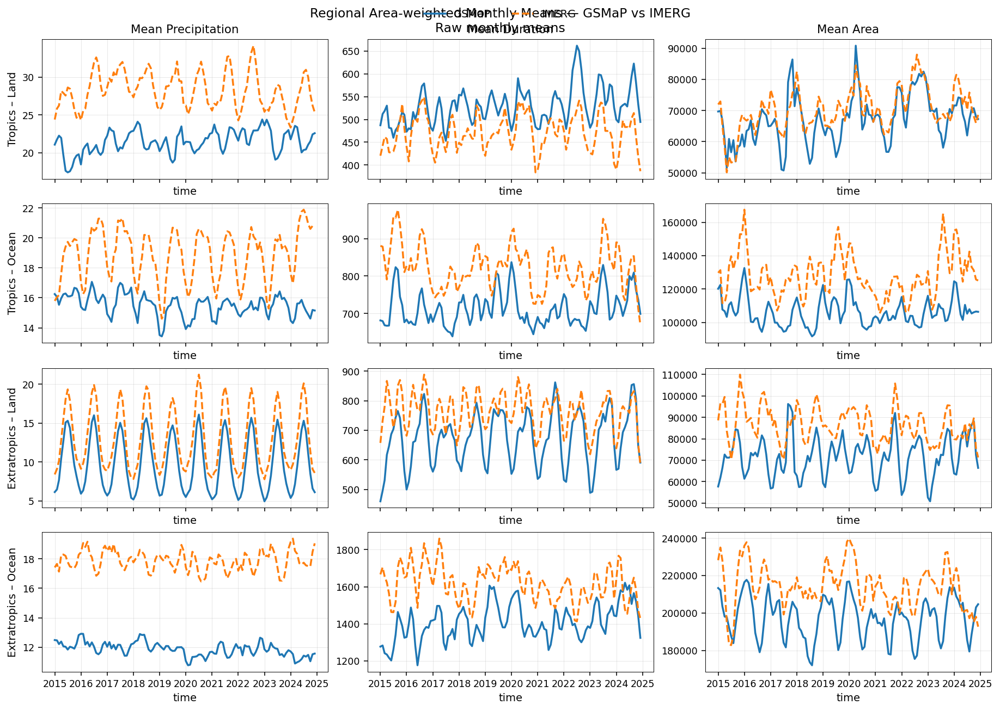

In [58]:
# =======================
# EXECUTAR (ajuste os nomes caso necessário)
# =======================
g_mp = gsmap_ds_v8_fam_mean_precip
g_md = gsmap_ds_v8_fam_mean_duration
g_ma = gsmap_ds_v8_fam_mean_size
i_mp = imerg_ds_v7_fam_mean_precip
i_md = imerg_ds_v7_fam_mean_duration
i_ma = imerg_ds_v7_fam_mean_size

fig = make_ts_figure(g_mp, g_md, g_ma, i_mp, i_md, i_ma, use_anomalies=False)
plt.show()

In [ ]:
gsmap_ds_v8_fam_mean_precip
imerg_ds_v7_fam_mean_precip

gsmap_ds_v8_fam_mean_size
imerg_ds_v7_fam_mean_size

gsmap_ds_v8_fam_mean_duration
imerg_ds_v7_fam_mean_duration

<xarray.DataArray (time: 120, lat: 1200, lon: 3600)> Size: 2GB
dask.array<rechunk-p2p, shape=(120, 1200, 3600), dtype=float32, chunksize=(120, 50, 50), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 960B 2015-01-01 2015-02-01 ... 2024-12-01
  * lat      (lat) float64 10kB -59.95 -59.85 -59.75 ... 59.75 59.85 59.95
  * lon      (lon) float64 29kB -179.9 -179.8 -179.8 ... 179.8 179.8 179.9

In [ ]:
# -*- coding: utf-8 -*-
# Pairwise variable correlations (temporal, per pixel):
# GSMaP and IMERG, for: (MP×MD), (MP×MA), (MD×MA)
#
# Entradas esperadas (DataArray: time×lat×lon; float):
#   gsmap_ds_v8_fam_mean_precip
#   gsmap_ds_v8_fam_mean_duration
#   gsmap_ds_v8_fam_mean_size
#   imerg_ds_v7_fam_mean_precip
#   imerg_ds_v7_fam_mean_duration
#   imerg_ds_v7_fam_mean_size

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# =========================
# PARÂMETROS
# =========================
DESEASONALIZE   = False   # True para correlacionar anomalias (remove ciclo anual)
MIN_VALID       = 60      # meses válidos mínimos por pixel (ambas variáveis)
CHUNKS          = {'time': 120, 'lat': 200, 'lon': 300}
PLOT_COARSEN    = None    # ex.: {'lat': 2, 'lon': 2} para coarsen rápido; ou None
PLOT_DECIMATE   = 2       # passo para isel (None para não decimar). Usado se PLOT_COARSEN=None
CMAP            = "RdBu_r"
VMIN, VMAX      = -1.0, 1.0

# =========================
# FUNÇÕES RÁPIDAS
# =========================
def _to_float32(da): 
    return da.astype('float32', copy=False)

def _align(a: xr.DataArray, b: xr.DataArray):
    """Interseção e alinhamento explícitos de time/lat/lon."""
    t   = np.intersect1d(a.time.values, b.time.values)
    lat = np.intersect1d(a.lat.values,  b.lat.values)
    lon = np.intersect1d(a.lon.values,  b.lon.values)
    return a.sel(time=t, lat=lat, lon=lon), b.sel(time=t, lat=lat, lon=lon)

def deseasonalize(da: xr.DataArray, time_name="time") -> xr.DataArray:
    clim = da.groupby(f"{time_name}.month").mean(time_name, skipna=True)
    return da.groupby(f"{time_name}.month") - clim

def mask_min_overlap(a: xr.DataArray, b: xr.DataArray, min_valid=MIN_VALID) -> xr.DataArray:
    both = (~a.isnull()) & (~b.isnull())
    return both.sum('time') >= min_valid

def corr_time_fast(a: xr.DataArray, b: xr.DataArray) -> xr.DataArray:
    """
    Correlação de Pearson ao longo de 'time' (NaN-safe) usando fórmula vetorizada.
    r = cov(a,b)/[std(a)*std(b)] com cov = mean((a-ā)*(b-b̄))
    """
    # remover amostras sem sobreposição
    m = (~a.isnull()) & (~b.isnull())
    a = a.where(m)
    b = b.where(m)

    # médias temporais
    am = a.mean('time', skipna=True)
    bm = b.mean('time', skipna=True)

    # covariância e desvios padrão
    cov = ((a - am) * (b - bm)).mean('time', skipna=True)
    sa  = a.std('time', skipna=True)
    sb  = b.std('time', skipna=True)

    r = cov / (sa * sb)
    return r.clip(min=-1.0, max=1.0)

def maybe_coarsen_for_plot(rmap: xr.DataArray) -> xr.DataArray:
    if PLOT_COARSEN:
        rmap = rmap.coarsen(**PLOT_COARSEN, boundary="trim").mean()
    elif PLOT_DECIMATE:
        rmap = rmap.isel(lat=slice(None, None, PLOT_DECIMATE),
                         lon=slice(None, None, PLOT_DECIMATE))
    return rmap

def plot_world(ax, rmap: xr.DataArray, title: str):
    proj = ccrs.PlateCarree()
    ax.set_global()
    ax.coastlines(linewidth=0.6)
    ax.add_feature(cfeature.BORDERS, linewidth=0.2, edgecolor='gray', alpha=0.5)
    ax.gridlines(draw_labels=False, linewidth=0.2, color='gray', alpha=0.3, linestyle='--')

    im = ax.pcolormesh(rmap['lon'], rmap['lat'], rmap,
                       transform=proj, cmap=CMAP, vmin=VMIN, vmax=VMAX)
    ax.set_title(title, fontsize=10)
    return im

# =========================
# PIPELINE
# =========================
def compute_pair_r(a: xr.DataArray, b: xr.DataArray) -> xr.DataArray:
    a, b = _align(_to_float32(a), _to_float32(b))
    if DESEASONALIZE:
        a = deseasonalize(a); b = deseasonalize(b)
    a = a.chunk(CHUNKS); b = b.chunk(CHUNKS)

    # máscara de sobreposição mínima
    keep = mask_min_overlap(a, b, MIN_VALID)
    a = a.where(keep)
    b = b.where(keep)

    r = corr_time_fast(a, b)
    return r

def make_figure_pairwise(
    g_mp, g_md, g_ma,
    i_mp, i_md, i_ma
):
    # Pares por produto
    pairs = [
        ("Mean Precipitation × Mean Duration",  g_mp, g_md, i_mp, i_md),
        ("Mean Precipitation × Mean Area",      g_mp, g_ma, i_mp, i_ma),
        ("Mean Duration × Mean Area",           g_md, g_ma, i_md, i_ma),
    ]

    fig = plt.figure(figsize=(12.5, 8.5), dpi=140)
    gs  = fig.add_gridspec(nrows=3, ncols=3, width_ratios=[1, 1, 0.05], hspace=0.18, wspace=0.08)

    for row, (label, g_a, g_b, i_a, i_b) in enumerate(pairs):
        # GSMaP
        r_g = compute_pair_r(g_a, g_b)
        r_gp = maybe_coarsen_for_plot(r_g)
        ax1 = fig.add_subplot(gs[row, 0], projection=ccrs.PlateCarree())
        im1 = plot_world(ax1, r_gp, f"{label} — GSMaP (r)")
        # IMERG
        r_i = compute_pair_r(i_a, i_b)
        r_ip = maybe_coarsen_for_plot(r_i)
        ax2 = fig.add_subplot(gs[row, 1], projection=ccrs.PlateCarree())
        im2 = plot_world(ax2, r_ip, f"{label} — IMERG (r)")

        # Colorbar (compartilhada em cada linha)
        cax = fig.add_subplot(gs[row, 2])
        cb = plt.colorbar(im2, cax=cax)
        cb.set_label("Correlation r")

    supt = "Pairwise Pixel-wise Temporal Correlations (2015–2024)\n" \
           "GSMaP and IMERG — " + ("Anomaly series (deseasonalized)" if DESEASONALIZE else "Raw monthly means")
    fig.suptitle(supt, fontsize=12, y=0.99)
    return fig




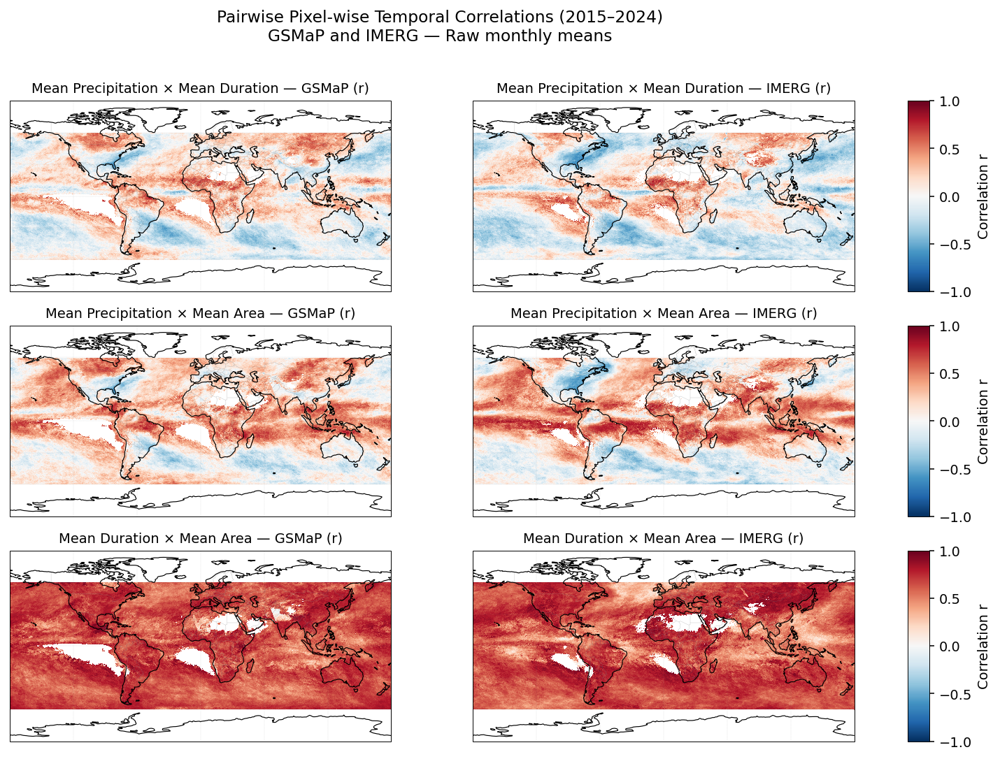

In [53]:

g_mp = gsmap_ds_v8_fam_mean_precip
g_md = gsmap_ds_v8_fam_mean_duration
g_ma = gsmap_ds_v8_fam_mean_size
i_mp = imerg_ds_v7_fam_mean_precip
i_md = imerg_ds_v7_fam_mean_duration
i_ma = imerg_ds_v7_fam_mean_size

fig = make_figure_pairwise(g_mp, g_md, g_ma, i_mp, i_md, i_ma)
plt.show()

In [ ]:
# -*- coding: utf-8 -*-
# Atlas de Correlação Espacial (GSMaP × IMERG) — MP, MD, MA
# Requisitos: xarray, numpy, matplotlib, cartopy, scipy (para t-student)
# Opcional: dask (para performance com grandes grades)

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.stats import t as student_t

# ============================
# CONFIGURAÇÕES DO EXPERIMENTO
# ============================

ALPHA = 0.05                # nível de significância para hachuras
MIN_VALID = 60              # número mínimo de meses válidos por pixel
DESEASONALIZE = False       # remover ciclo anual antes da correlação?
USE_SPEARMAN = False        # se True, usa Spearman; caso contrário, Pearson
VAR_SPECS = [
    dict(name="Mean Precipitation", key="mp", 
         g="gsmap_ds_v8_fam_mean_precip", i="imerg_ds_v7_fam_mean_precip",
         cmap="RdBu_r", vmin=-1.0, vmax=1.0),
    dict(name="Mean Duration",       key="md", 
         g="gsmap_ds_v8_fam_mean_duration", i="imerg_ds_v7_fam_mean_duration",
         cmap="RdBu_r", vmin=-1.0, vmax=1.0),
    dict(name="Mean Area",           key="ma", 
         g="gsmap_ds_v8_fam_mean_size", i="imerg_ds_v7_fam_mean_size",
         cmap="RdBu_r", vmin=-1.0, vmax=1.0),
]

# Zonas latitudinais para os sumários (ajuste se desejar)
ZONES = {
    "Tropics (|lat|≤20°)":  (-20,  20),
    "Subtropics (20–35°)":  ((20, 35), (-35, -20)),   # dupla faixa N/S
    "Extratropics (35–60°)":((35, 60), (-60, -35)),
}

# ============================
# FUNÇÕES AUXILIARES
# ============================

def get_da_by_name(name: str) -> xr.DataArray:
    """Recupera o DataArray do namespace global pelo nome (string)."""
    return globals()[name]

def intersect_time_lat_lon(da_g: xr.DataArray, da_i: xr.DataArray) -> tuple:
    """Interseção de eixos (time, lat, lon) e alinhamento."""
    # interseção explícita para evitar desalinhamentos silenciosos
    t = np.intersect1d(da_g['time'].values, da_i['time'].values)
    lat = np.intersect1d(da_g['lat'].values,  da_i['lat'].values)
    lon = np.intersect1d(da_g['lon'].values,  da_i['lon'].values)
    g = da_g.sel(time=t, lat=lat, lon=lon)
    i = da_i.sel(time=t, lat=lat, lon=lon)
    return g, i

def remove_seasonal_cycle(da: xr.DataArray, time_name: str = "time") -> xr.DataArray:
    """Remove ciclo anual: X' = X - climatologia mensal."""
    clim = da.groupby(f"{time_name}.month").mean(time_name, skipna=True)
    return da.groupby(f"{time_name}.month") - clim

def lag1_autocorr(da: xr.DataArray, dim: str = "time") -> xr.DataArray:
    """Autocorrelação lag-1 por pixel (Pearson). NaN-safe."""
    x = da
    x0 = x.isel({dim: slice(0, -1)})
    x1 = x.isel({dim: slice(1,  None)})
    # usar xr.corr com alinhamento ao longo do dim encurtado
    r1 = xr.corr(x0, x1, dim=dim)
    return r1

def pearson_r(da_g: xr.DataArray, da_i: xr.DataArray, dim="time") -> xr.DataArray:
    return xr.corr(da_g, da_i, dim=dim)

def spearman_r(da_g: xr.DataArray, da_i: xr.DataArray, dim="time") -> xr.DataArray:
    # classificação de postos por pixel (rankdata-like com xarray)
    rg = da_g.rank(dim, pct=False, method="average")
    ri = da_i.rank(dim, pct=False, method="average")
    return xr.corr(rg, ri, dim=dim)

def effective_sample_size(da_g: xr.DataArray, da_i: xr.DataArray, dim="time") -> xr.DataArray:
    """
    Neff ≈ N * (1 - r1_g * r1_i) / (1 + r1_g * r1_i)  (Pyper & Peterman, 1998)
    com r1_* autocorrelações lag-1 por pixel. Trunca para [3, N].
    """
    N = da_g[dim].size
    r1g = lag1_autocorr(da_g, dim=dim)
    r1i = lag1_autocorr(da_i, dim=dim)
    num = (1 - r1g * r1i)
    den = (1 + r1g * r1i)
    neff = N * (num / den)
    neff = neff.clip(min=3, max=N)  # evitar valores inválidos
    return neff

def r_and_p(da_g: xr.DataArray, da_i: xr.DataArray, dim="time", use_spearman=False) -> xr.Dataset:
    """Calcula r por pixel e p-valor com Neff corrigido para autocorrelação."""
    # remover sazonalidade se configurado
    g = remove_seasonal_cycle(da_g, dim) if DESEASONALIZE else da_g
    i = remove_seasonal_cycle(da_i, dim) if DESEASONALIZE else da_i

    # contagem de válidos simultâneos por pixel
    valid = xr.Dataset(dict(g=g, i=i)).dropna(dim, how='any')
    n = valid[dim].size
    # r
    r = spearman_r(g, i, dim) if use_spearman else pearson_r(g, i, dim)
    # Neff e p-valor (t de Student)
    neff = effective_sample_size(g, i, dim=dim)
    df = neff - 2
    # evitar divisões por zero
    r_clipped = r.clip(min=-0.999999, max=0.999999)
    t_stat = r_clipped * np.sqrt((df) / (1 - r_clipped**2))
    p = xr.apply_ufunc(lambda x, nu: 2*student_t.sf(np.abs(x), df=np.maximum(nu, 1)),
                       t_stat, df, vectorize=True, dask='parallelized',
                       input_core_dims=[[], []], output_core_dims=[[]])
    return xr.Dataset(dict(r=r, p=p, n=xr.full_like(r, n), neff=neff))

def mask_min_valid(da_g, da_i, dim="time", min_valid=MIN_VALID) -> xr.DataArray:
    """Máscara booleana: pixels com número de meses válidos simultâneos ≥ min_valid."""
    both = xr.Dataset(dict(g=da_g, i=da_i))
    valid = (~both['g'].isnull()) & (~both['i'].isnull())
    count = valid.sum(dim=dim)
    return count >= min_valid

def r_to_z_fisher(r: xr.DataArray) -> xr.DataArray:
    """Transformação z de Fisher para promediar correlações."""
    r = r.clip(min=-0.999999, max=0.999999)
    return 0.5 * np.log((1 + r) / (1 - r))

def zonal_bins(lat: xr.DataArray, zones: dict):
    """Retorna dict {zone_name: boolean mask over (lat)}."""
    out = {}
    for name, bounds in zones.items():
        if isinstance(bounds[0], tuple):  # zonas duplas (N/S)
            parts = []
            for b in bounds:
                lo, hi = (b[0], b[1])
                parts.append((lat >= lo) & (lat <= hi))
            m = parts[0]
            for p in parts[1:]:
                m = m | p
        else:
            lo, hi = bounds
            m = (lat >= lo) & (lat <= hi)
        out[name] = m
    return out

def extract_zone_values(r_map: xr.DataArray, zones: dict) -> dict:
    """Extrai valores de r por zona para violin/box (sem peso; opcional: pesar por cos(lat))."""
    lat = r_map['lat']
    zone_masks = zonal_bins(lat, zones)
    vals = {}
    # peso de área (opcional) – se desejar, use ao promediar, não no violin
    for zn, m in zone_masks.items():
        rz = r_map.where(m, drop=True)
        vals[zn] = rz.values.ravel()
    return vals

# ============================
# PLOTAGEM
# ============================

def plot_r_map(ax, r: xr.DataArray, p: xr.DataArray, title: str,
               vmin=-1, vmax=1, cmap="RdBu_r", alpha=ALPHA):
    proj = ccrs.PlateCarree()
    ax.set_global()
    ax.coastlines(linewidth=0.6)
    ax.add_feature(cfeature.BORDERS, linewidth=0.2, edgecolor='gray', alpha=0.5)
    gl = ax.gridlines(draw_labels=False, linewidth=0.2, color='gray', alpha=0.3, linestyle='--')

    im = ax.pcolormesh(r['lon'], r['lat'], r, transform=proj, cmap=cmap, vmin=vmin, vmax=vmax)
    # Hachuras para p < alpha
    sig = (p < alpha)
    # Para hachurar, usamos contourf com facecolor transparente
    ax.contourf(r['lon'], r['lat'], sig, levels=[0.5, 1.5],
                hatches=['////'], colors='none', transform=proj, linewidths=0)
    ax.set_title(title, fontsize=10)
    return im

def make_figure(results):
    """
    results: dict var_key -> xr.Dataset(r, p, n, neff) + map
    Desenha 3 mapas + 3 mini violin plots (um por variável).
    """
    fig = plt.figure(figsize=(13, 8), dpi=140)
    gs = fig.add_gridspec(nrows=2, ncols=3, height_ratios=[1.0, 0.45], hspace=0.18, wspace=0.08)

    # Linha 1: Mapas
    caxes = []
    for j, spec in enumerate(VAR_SPECS):
        ax = fig.add_subplot(gs[0, j], projection=ccrs.PlateCarree())
        ds = results[spec['key']]
        im = plot_r_map(ax, ds['r'], ds['p'],
                        f"{spec['name']}: r(GSMaP, IMERG) 2015–2024",
                        vmin=spec['vmin'], vmax=spec['vmax'], cmap=spec['cmap'])
        cax = fig.add_axes([ax.get_position().x1 + 0.005, ax.get_position().y0, 0.012, ax.get_position().height])
        cb = plt.colorbar(im, cax=cax)
        cb.set_label("Correlation r")
        caxes.append(cax)

    # Linha 2: Violins por zona (um painel por variável)
    for j, spec in enumerate(VAR_SPECS):
        axv = fig.add_subplot(gs[1, j])
        ds = results[spec['key']]
        zone_vals = extract_zone_values(ds['r'], ZONES)
        labels, data = zip(*[(k, np.asarray(v)[np.isfinite(v)]) for k, v in zone_vals.items()])
        axv.violinplot(data, showmeans=True, showextrema=False)
        axv.set_xticks(range(1, len(labels)+1), labels, rotation=15, ha='right')
        axv.set_ylabel("r")
        axv.set_ylim(-1.0, 1.0)
        axv.set_title(f"{spec['name']} — r by latitude zone")
        axv.grid(True, axis='y', linewidth=0.4, alpha=0.4)

    supt = "Atlas of Pixel-wise Temporal Correlation: GSMaP × IMERG (2015–2024)\n" \
           + ("Deseasonalized" if DESEASONALIZE else "Raw series")
    fig.suptitle(supt, fontsize=12, y=0.99)
    return fig

# ============================
# PIPELINE PRINCIPAL
# ============================

def compute_correlation_maps():
    """Executa todo o fluxo para MP, MD, MA e retorna dict de resultados."""
    out = {}
    for spec in VAR_SPECS:
        da_g = get_da_by_name(spec['g'])
        da_i = get_da_by_name(spec['i'])
        # interseção de eixos
        da_g, da_i = intersect_time_lat_lon(da_g, da_i)

        # filtro por amostragem mínima
        m_valid = mask_min_valid(da_g, da_i, dim="time", min_valid=MIN_VALID)
        da_g = da_g.where(m_valid)
        da_i = da_i.where(m_valid)

        # correlação e p-valor
        ds = r_and_p(da_g, da_i, dim="time", use_spearman=USE_SPEARMAN)
        # manter somente lat/lon (r, p) — já alinhados
        out[spec['key']] = ds
    return out

# ======== EXECUÇÃO ==========



/opt/anaconda3/envs/pyfortracc/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/anaconda3/envs/pyfortracc/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/anaconda3/envs/pyfortracc/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/anaconda3/envs/pyfortracc/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/anaconda3/envs/pyfortracc/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/anaconda3/envs/pyfortracc/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divi

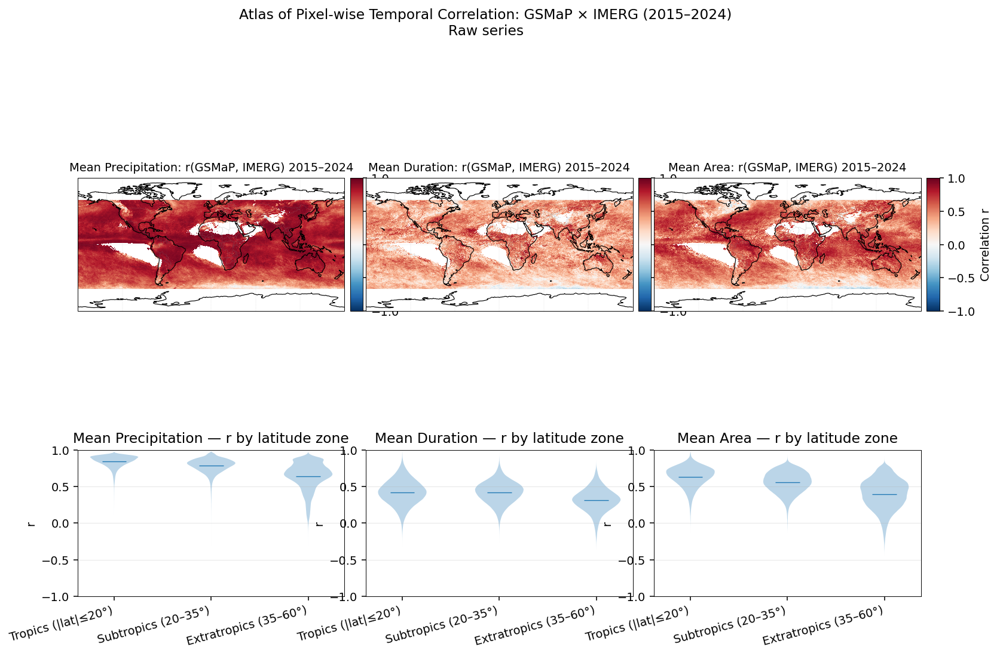

In [50]:
results = compute_correlation_maps()
fig = make_figure(results)
plt.show()

In [14]:
gsmap_fam_mean_trend = gsmap_fam_mean_precip_trend['slope']
imerg_fam_mean_trend = imerg_fam_mean_precip_trend['slope']

gsmap_fam_duration_trend = gsmap_fam_mean_duration_trend['slope']
imerg_fam_duration_trend = imerg_fam_mean_duration_trend['slope']

gsmap_fam_area_trend = gsmap_fam_mean_size_trend['slope']
imerg_fam_area_trend = imerg_fam_mean_size_trend['slope']

# Set crs of the trend DataArrays
gsmap_fam_mean_trend = gsmap_fam_mean_trend.rio.write_crs("EPSG:4326")
imerg_fam_mean_trend = imerg_fam_mean_trend.rio.write_crs("EPSG:4326")
gsmap_fam_duration_trend = gsmap_fam_duration_trend.rio.write_crs("EPSG:4326")
imerg_fam_duration_trend = imerg_fam_duration_trend.rio.write_crs("EPSG:4326")
gsmap_fam_area_trend = gsmap_fam_area_trend.rio.write_crs("EPSG:4326")
imerg_fam_area_trend = imerg_fam_area_trend.rio.write_crs("EPSG:4326")

In [11]:
import geopandas as gpd

In [42]:
ipp_geo_mapas = gpd.read_file("masks/IPCC-WGI-reference-regions-v4_shapefile/IPCC-WGI-reference-regions-v4.shp")
# ipp_geo_mapas = ipp_geo_mapas.loc[ipp_geo_mapas['Type'] == 'Land']

<Axes: >

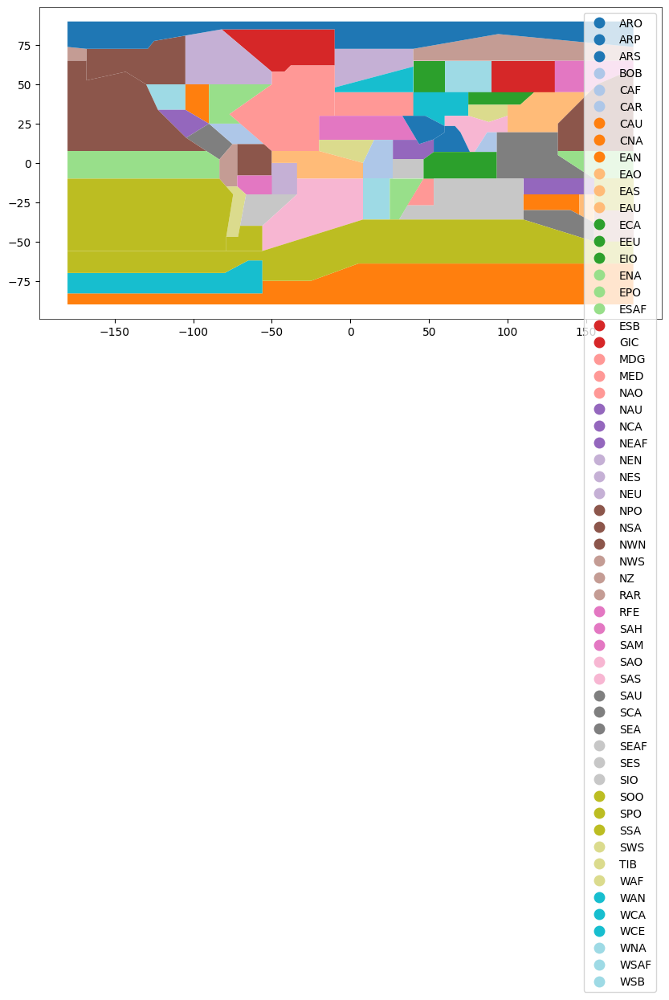

In [43]:
ipp_geo_mapas.plot(column='Acronym', cmap='tab20', legend=True, figsize=(10, 6))

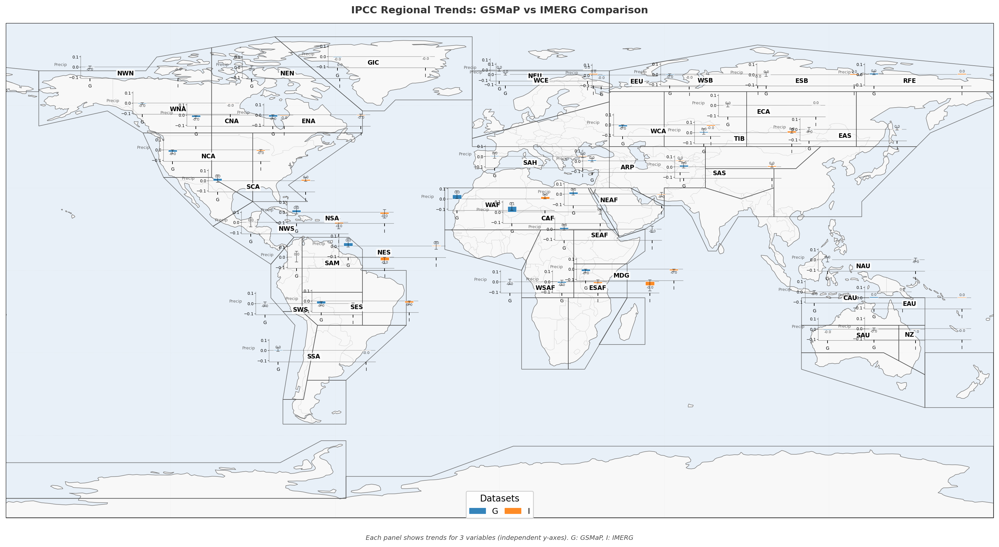

In [37]:
# =============================================================================
# IPCC regions: Transparent mini-panels with per-variable y-axes
# =============================================================================
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
from shapely.geometry import box
import hashlib
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.ticker import MaxNLocator
import matplotlib.patches as mpatches
from matplotlib import rcParams

# -------------------------
# Configuration Constants - Versão transparente e limpa
# -------------------------
LON_NAME, LAT_NAME = "lon", "lat"
VAR_ORDER = ["Pr"]
VAR_LABELS = {"Pr": "Precip", "Dur": "Duration", "Area": "Area"}  # Rótulos ultra curtos
DATASET_ORDER = ["GSMaP", "IMERG"]
DATASET_COLORS = {"GSMaP": "#1f77b4", "IMERG": "#ff7f0e"}
INSET_W, INSET_H = 0.13, 0.20       # Tamanho reduzido para melhor distribuição
MIN_CELLS = 3
USE_STDERR = False
N_YTICKS = 2
YLIM_MARGIN = 0.10                  # Margem reduzida para aproveitar espaço
JITTER_SCALE = 1.0
BAR_WIDTH = 0.1                    # Barras significativamente mais finas
Y_LABEL_FONTSIZE = 5.0              # Fonte pequena mas legível
X_LABEL_FONTSIZE = 5.5              # Fonte reduzida
REGION_LABEL_FONTSIZE = 7.5         # Fonte moderada para região
VALUE_LABEL_FONTSIZE = 4.5          # Fonte pequena para valores
ZERO_LINE_ALPHA = 0.3               # Linha zero mais sutil
GRID_ALPHA = 0.15                   # Grade quase invisível
AXES_EDGE_COLOR = '#666666'         # Cor suave para eixos
AXES_BG_ALPHA = 0.2                 # Fundo totalmente transparente
REGION_LABEL_ALPHA = 0.85           # Sutil transparência no rótulo da região

# -------------------------
# Spatial Utilities (mantidas otimizadas)
# -------------------------
def normalize_longitude(da, lon_name="lon"):
    """Convert longitude from 0-360 to -180-180 range."""
    lon = da[lon_name].values
    if np.nanmin(lon) >= 0 and np.nanmax(lon) > 180:
        lon = ((lon + 180) % 360) - 180
        da = da.assign_coords({lon_name: xr.DataArray(lon, dims=(lon_name,))}).sortby(lon_name)
    return da

def prepare_spatial_data(da, lon_name="lon", lat_name="lat", crs="EPSG:4326"):
    """Standardize spatial dimensions and CRS for xarray objects."""
    rename_map = {}
    if lon_name not in da.dims:
        for alias in ("lon", "longitude", "x"):
            if alias in da.dims:
                rename_map[alias] = lon_name
                break
    if lat_name not in da.dims:
        for alias in ("lat", "latitude", "y"):
            if alias in da.dims:
                rename_map[alias] = lat_name
                break
    if rename_map:
        da = da.rename(rename_map)
    
    if {lat_name, lon_name}.issubset(da.dims):
        da = da.transpose(..., lat_name, lon_name)
    
    da = normalize_longitude(da, lon_name)
    da = da.rio.write_crs(crs, inplace=False)
    da = da.rio.set_spatial_dims(x_dim=lon_name, y_dim=lat_name, inplace=False)
    return da

def calculate_region_stats(da, geom, lon_name="lon", lat_name="lat", use_stderr=False):
    """Compute mean, error and cell count for a region."""
    try:
        clipped = da.rio.clip([geom.buffer(0)], da.rio.crs, drop=False, all_touched=True)
        spatial_dims = [lat_name, lon_name]
        valid_mask = clipped.notnull()
        n_cells = int(valid_mask.sum(dim=spatial_dims).max().item())
        
        if n_cells == 0:
            return np.nan, np.nan, 0
        
        mean_val = clipped.mean(dim=spatial_dims, skipna=True)
        std_val = clipped.std(dim=spatial_dims, skipna=True)
        
        for dim in list(mean_val.dims):
            mean_val = mean_val.mean(dim=dim, skipna=True)
            std_val = std_val.mean(dim=dim, skipna=True)
        
        mean_val = float(mean_val.values)
        std_val = float(std_val.values)
        
        error = std_val / np.sqrt(max(n_cells, 1)) if use_stderr else std_val
        return mean_val, error, n_cells
    
    except Exception:
        return np.nan, np.nan, 0

def get_region_anchor(geom, da, lon_name="lon", lat_name="lat"):
    """Calculate representative point for region labeling."""
    try:
        clipped = da.rio.clip([geom.buffer(0)], da.rio.crs, drop=False, all_touched=True)
        valid_mask = clipped.notnull()
        if valid_mask.sum([lat_name, lon_name]).item() > 0:
            lon_vals = clipped[lon_name]
            lat_vals = clipped[lat_name]
            lon_c = float(lon_vals.where(valid_mask.any(lat_name), drop=True).mean().item())
            lat_c = float(lat_vals.where(valid_mask.any(lon_name), drop=True).mean().item())
            return lon_c, lat_c
    except Exception:
        pass
    rp = geom.representative_point()
    return float(rp.x), float(rp.y)

def calculate_jitter(acronym, scale=1.0):
    """Generate deterministic jitter for label positioning."""
    h = hashlib.md5(acronym.encode()).hexdigest()
    angle = (int(h[:2], 16) / 255.0) * 2 * np.pi
    radius = (int(h[2:4], 16) / 255.0) * scale * 0.4
    return radius * np.cos(angle), radius * np.sin(angle)

# -------------------------
# Coordinate Transformation Utilities
# -------------------------
def to_axes_frac(ax, lon, lat):
    """Convert geographic coordinates to axes fraction coordinates."""
    xpix, ypix = ax.transData.transform((lon, lat))
    return ax.transAxes.inverted().transform((xpix, ypix))

def create_transparent_panel(ax, x_frac, y_frac, width=INSET_W, height=INSET_H):
    """Create fully transparent inset axes."""
    x_frac = np.clip(x_frac, width/2 + 0.02, 1 - width/2 - 0.02)
    y_frac = np.clip(y_frac, height/2 + 0.02, 1 - height/2 - 0.02)
    rect = [x_frac - width/2, y_frac - height/2, width, height]
    
    # Create transparent axes
    panel = ax.inset_axes(rect, transform=ax.transAxes)
    panel.set_facecolor((1, 1, 1, 0))  # Total transparency
    panel.set_xticks([])
    panel.set_yticks([])
    panel.spines['top'].set_visible(False)
    panel.spines['right'].set_visible(False)
    panel.spines['bottom'].set_visible(False)
    panel.spines['left'].set_visible(False)
    
    return panel

# -------------------------
# Plotting Utilities - Versão transparente e minimalista
# -------------------------
def setup_variable_subplot(ax, var, ylims, is_bottom=False, var_label=None):
    """Configure transparent subplot with minimal styling."""
    lo, hi = ylims[var]
    ax.set_ylim(lo, hi)
    
    # Add zero line if crossing origin
    if lo < 0 < hi:
        ax.axhline(0, lw=0.6, color="k", alpha=ZERO_LINE_ALPHA, zorder=1)
    
    # Configure y-axis ticks with minimal styling
    ax.yaxis.set_major_locator(MaxNLocator(nbins=N_YTICKS, prune='both'))
    ax.tick_params(axis="y", labelsize=Y_LABEL_FONTSIZE, length=1.5, pad=1, width=0.4)
    ax.set_xticks([0, 1])  # Fixed positions: 0=GSMaP, 1=IMERG
    
    # Configure x-axis labels (only on bottom subplot)
    if is_bottom:
        ax.set_xticklabels(['G', 'I'], fontsize=X_LABEL_FONTSIZE, rotation=0)  # G=GSMap, I=IMERG
    else:
        ax.set_xticklabels([])
    
    # Clean spines with minimal visibility
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)
    for spine in ['left', 'bottom']:
        ax.spines[spine].set_linewidth(0.5)
        ax.spines[spine].set_color(AXES_EDGE_COLOR)
        ax.spines[spine].set_alpha(0.7)
    
    # Add variable label as y-axis label (very compact)
    if var_label:
        ax.set_ylabel(var_label, fontsize=Y_LABEL_FONTSIZE+0.2, labelpad=2, rotation=0, ha='right',
                     color='#444444', alpha=0.8)
    
    # No grid - clean look
    ax.grid(False)
    
    return ax

def plot_variable_bars(ax, data, var, ylims):
    """Plot thin side-by-side bars for GSMaP vs IMERG with transparency-friendly styling."""
    sub = data[data["Variable"] == var].set_index("Dataset")
    xs = [0, 1]  # Fixed positions: 0=GSMaP, 1=IMERG
    
    for j, ds in enumerate(DATASET_ORDER):
        if ds in sub.index and np.isfinite(sub.loc[ds, "Value"]):
            val = float(sub.loc[ds, "Value"])
            err = float(sub.loc[ds, "Err"]) if np.isfinite(sub.loc[ds, "Err"]) else 0.0
            
            # Plot thin bar with subtle edge
            bar = ax.bar(xs[j], val, width=BAR_WIDTH, color=DATASET_COLORS[ds], 
                        edgecolor='white', linewidth=0.5, alpha=0.9, zorder=3)
            
            # Add value label only if space allows (very compact)
            if np.isfinite(val) and (hi - lo) > 0.1:  # Only show if range is meaningful
                text_color = '#222222'  # Neutral color for better visibility
                vertical_alignment = 'bottom' if val >= 0 else 'top'
                y_offset = 0.025 * (ylims[var][1] - ylims[var][0]) * (1 if val >= 0 else -1)
                
                ax.text(xs[j], val + y_offset, f'{val:.1f}', 
                       ha='center', va=vertical_alignment, 
                       fontsize=VALUE_LABEL_FONTSIZE,
                       color=text_color,
                       alpha=0.85,
                       zorder=5)
            
            # Add subtle error bars
            if err > 0 and np.isfinite(err) and err > 0.01:  # Only show meaningful errors
                ax.errorbar(xs[j], val, yerr=err, fmt="none", lw=0.6, 
                           capsize=2, capthick=0.6, ecolor="k", alpha=0.6, zorder=4)
    
    return ax

def calculate_variable_ylims(stats_df, margin=0.10):
    """Compute y-axis limits separately for each variable across all regions."""
    ylims = {}
    for var in VAR_ORDER:
        subset = stats_df[stats_df["Variable"] == var]
        values = subset["Value"].to_numpy()
        errors = subset["Err"].to_numpy()
        
        valid_mask = np.isfinite(values) & np.isfinite(errors)
        if not np.any(valid_mask):
            ylims[var] = (-1, 1)
            continue
        
        min_val = np.nanmin(values[valid_mask] - errors[valid_mask])
        max_val = np.nanmax(values[valid_mask] + errors[valid_mask])
        
        if min_val == max_val or not np.isfinite(min_val) or not np.isfinite(max_val):
            max_abs = np.nanmax(np.abs(values[valid_mask]))
            max_abs = max_abs if np.isfinite(max_abs) and max_abs > 0 else 1.0
            min_val, max_val = -max_abs, max_abs
        
        span = max_val - min_val
        if span < 1e-6:  # Quase zero
            span = max_abs * 0.3 or 1.0
        
        margin_val = span * margin
        ylims[var] = (min_val - margin_val, max_val + margin_val)
    
    return ylims

# -------------------------
# Main Execution - Versão transparente e limpa
# -------------------------
def main():
    # Prepare datasets
    datasets = {
        "GSMaP": {
            "Pr":   prepare_spatial_data(gsmap_fam_mean_trend, LON_NAME, LAT_NAME),
            "Dur":  prepare_spatial_data(gsmap_fam_duration_trend, LON_NAME, LAT_NAME),
            "Area": prepare_spatial_data(gsmap_fam_area_trend, LON_NAME, LAT_NAME),
        },
        "IMERG": {
            "Pr":   prepare_spatial_data(imerg_fam_mean_trend, LON_NAME, LAT_NAME),
            "Dur":  prepare_spatial_data(imerg_fam_duration_trend, LON_NAME, LAT_NAME),
            "Area": prepare_spatial_data(imerg_fam_area_trend, LON_NAME, LAT_NAME),
        }
    }
    
    # Prepare regions
    ref_crs = datasets["GSMaP"]["Pr"].rio.crs
    regions_gdf = ipp_geo_mapas.copy()
    if regions_gdf.crs is None:
        regions_gdf = regions_gdf.set_crs("EPSG:4326")
    regions_gdf = regions_gdf.to_crs(ref_crs)
    regions_gdf["geometry"] = regions_gdf.geometry.buffer(0)
    
    # Calculate regional statistics
    stats_rows = []
    for _, region in regions_gdf.iterrows():
        acronym = region["Acronym"]
        geom = region["geometry"]
        
        for var in VAR_ORDER:
            for ds_name in DATASET_ORDER:
                da = datasets[ds_name][var]
                val, err, n = calculate_region_stats(da, geom, LON_NAME, LAT_NAME, USE_STDERR)
                stats_rows.append({
                    "Acronym": acronym,
                    "Variable": var,
                    "Dataset": ds_name,
                    "Value": val,
                    "Err": err,
                    "N": n
                })
    
    stats_df = pd.DataFrame(stats_rows)
    
    # Calculate y-axis limits per variable
    var_ylims = calculate_variable_ylims(stats_df, YLIM_MARGIN)
    
    # Configure matplotlib for clean rendering
    rcParams['axes.linewidth'] = 0.5
    rcParams['grid.linewidth'] = 0.3
    rcParams['lines.linewidth'] = 0.7
    rcParams['font.family'] = 'sans-serif'
    rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']
    
    # Create main figure
    proj = ccrs.PlateCarree()
    fig = plt.figure(figsize=(18, 9.5), dpi=180)
    ax = plt.axes(projection=proj)
    ax.set_global()
    
    # Add map features with subtle styling
    ax.coastlines(linewidth=0.6, color='#777777', zorder=1)
    ax.add_feature(cfeature.BORDERS, linewidth=0.3, alpha=0.5, edgecolor='#999999', zorder=1)
    ax.add_feature(cfeature.LAND, facecolor="#f8f8f8", edgecolor="none", zorder=0)
    ax.add_feature(cfeature.OCEAN, facecolor="#e8f0f8", edgecolor="none", zorder=0)
    ax.gridlines(draw_labels=False, linewidth=0.25, alpha=0.3, linestyle=':', color='#bbbbbb', zorder=0)
    regions_gdf.boundary.plot(ax=ax, transform=proj, linewidth=0.7, edgecolor="#444444", alpha=0.7, zorder=2)
    
    # Add mini-panels for each region - TOTALMENTE TRANSPARENTES
    ref_da = datasets[DATASET_ORDER[0]][VAR_ORDER[0]]
    for _, region in regions_gdf.iterrows():
        acronym = region["Acronym"]
        geom = region["geometry"]
        region_data = stats_df[stats_df["Acronym"] == acronym]
        
        # Skip regions with no valid data
        if not np.isfinite(region_data["Value"]).any():
            continue
        
        # Calculate anchor position with jitter
        lon0, lat0 = get_region_anchor(geom, ref_da, LON_NAME, LAT_NAME)
        dx, dy = calculate_jitter(acronym, JITTER_SCALE)
        lon_pos, lat_pos = lon0 + dx, lat0 + dy
        
        # Convert to axes fraction coordinates
        x_frac, y_frac = to_axes_frac(ax, lon_pos, lat_pos)
        
        # Create fully transparent panel
        panel = create_transparent_panel(ax, x_frac, y_frac, INSET_W, INSET_H)
        
        # Add region title with subtle background
        panel.text(0.5, 0.99, acronym, ha="center", va="top", 
                  fontsize=REGION_LABEL_FONTSIZE, fontweight='bold',
                  bbox=dict(facecolor='white', alpha=REGION_LABEL_ALPHA, edgecolor='none', 
                           boxstyle='round,pad=0.15'),
                  transform=panel.transAxes, zorder=10)
        
        # Layout for 3 subplots stacked vertically - COMPACTO E SEM SOBREPOSIÇÃO
        n_vars = len(VAR_ORDER)
        subplot_height = 0.23   # Altura otimizada
        vertical_gap = 0.07     # Espaçamento generoso
        top_margin = 0.91       # Margem superior ajustada
        
        # Create subplots for each variable
        for i, var in enumerate(VAR_ORDER):
            # Calculate position for this subplot
            y0 = top_margin - (subplot_height + vertical_gap) * i
            
            # Create subplot axes - position optimized for transparency
            subplot_ax = panel.inset_axes([0.15, y0, 0.83, subplot_height])
            
            # Ensure subplot is also transparent
            subplot_ax.set_facecolor((1, 1, 1, 0))
            
            # Plot bars and configure
            plot_variable_bars(subplot_ax, region_data, var, var_ylims)
            is_bottom = (i == n_vars - 1)
            setup_variable_subplot(subplot_ax, var, var_ylims, is_bottom, VAR_LABELS[var])
    
    # Add compact global legend
    legend_elements = [
        mpatches.Patch(color=DATASET_COLORS[d], label=d[0], alpha=0.9,  # G and I only
                      edgecolor='white', linewidth=0.5)
        for d in DATASET_ORDER
    ]
    ax.legend(handles=legend_elements, loc="lower center", bbox_to_anchor=(0.5, -0.01),
             ncol=len(DATASET_ORDER), frameon=True, framealpha=0.92,
             facecolor='white', edgecolor='#cccccc', fontsize=10,
             title="Datasets", title_fontsize=11, columnspacing=0.8)
    
    # Add clean title
    ax.set_title("IPCC Regional Trends: GSMaP vs IMERG Comparison",
                fontsize=12.5, pad=12, fontweight='bold', color='#333333')
    
    # Add minimal explanatory text
    fig.text(0.5, 0.01, 
             "Each panel shows trends for 3 variables (independent y-axes). G: GSMaP, I: IMERG",
             ha='center', fontsize=8, alpha=0.7, style='italic')
    
    # Final layout - critical for transparency and spacing
    plt.tight_layout(rect=[0, 0.03, 1, 0.96], pad=0.5)
    plt.subplots_adjust(bottom=0.05, top=0.94)
    
    plt.show()

if __name__ == "__main__":
    main()

In [8]:
# Select point time series at specific location for testing
point_temporal_series = gsmap_ds_v8.sel(time=slice('2015-01-01', '2024-12-31'))
point_temporal_series = point_temporal_series.sel(lat=-5.0, lon=-62.0, method="nearest")

In [9]:
point_temporal_series_ = compute(point_temporal_series)

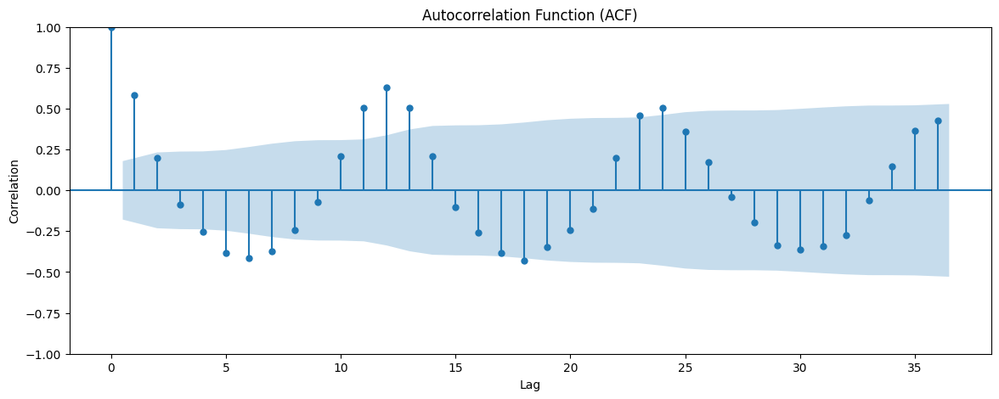

In [12]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

plt.figure(figsize=(14, 5))
plot_acf(point_temporal_series_['clu-values'], lags=36, ax=plt.gca())
plt.title("Autocorrelation Function (ACF)")
plt.xlabel("Lag")
plt.ylabel("Correlation")
plt.show()

In [ ]:
##### Teste Regressão Linear #####
# Ajuste polinomial de grau 1 (regressão linear)
fit = point_temporal_series.polyfit(dim="time", deg=1)
# Coeficiente angular (tendência)
linear_slope = fit[f"{'clu-values'}_polyfit_coefficients"].sel(degree=1).compute()
# Intercepto (opcional): Corresponde ao valor médio da série temporal
intercept = fit[f"{'clu-values'}_polyfit_coefficients"].sel(degree=0).compute()

In [17]:
######### Teste Theil-Sen #########
from scipy.stats import theilslopes
def theil_sen_slope(y, x):
    # NaN handling
    mask = np.isfinite(y) & np.isfinite(x)
    y = y[mask]
    x = x[mask]
    if len(y) < 2:
        return np.nan  # Not enough data points
    return theilslopes(y, x)[0]  # retorna apenas a inclinação

temporal_chunk = point_temporal_series["clu-values"].chunk({"time": -1})
# Chamada vetorizada sobre cada pixel
theil_sen_slope = xr.apply_ufunc(
    theil_sen_slope,
    temporal_chunk,
    temporal_chunk["time"].astype("int64"),
    input_core_dims=[["time"], ["time"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
)

In [18]:
# Mann-Kendall Trend Test
original = dask_mann_kendall(point_temporal_series['clu-values'], test="original", alpha=0.05, engine="ufunc")
seasonal = dask_mann_kendall(point_temporal_series['clu-values'], test="seasonal", period=12, alpha=0.05, engine="ufunc")
hamed_rao = dask_mann_kendall(point_temporal_series['clu-values'], test="hamed_rao", alpha=0.05, engine="ufunc", lag=None, period=None)
yue_wang = dask_mann_kendall(point_temporal_series['clu-values'], test="yue-wang", alpha=0.05, engine="ufunc", lag=None, period=None)

original_mann_kendall = compute(original)
seasonal_mann_kendall = compute(seasonal)
hamed_rao_mann_kendall = compute(hamed_rao)
yue_wang_mann_kendall = compute(yue_wang)

In [19]:
# print all ['p'] in original_mann_kendall, seasonal_mann_kendall, hamed_rao_mann_kendall, yue_wang_mann_kendall
print("Original Mann-Kendall p-value:", original_mann_kendall['p'].item())
print("Seasonal Mann-Kendall p-value:", seasonal_mann_kendall['p'].item())
print("Hamed-Rao Mann-Kendall p-value:", hamed_rao_mann_kendall['p'].item())
print("Yue-Wang Mann-Kendall p-value:", yue_wang_mann_kendall['p'].item())

Original Mann-Kendall p-value: 0.6386938691139221
Seasonal Mann-Kendall p-value: 0.5186049938201904
Hamed-Rao Mann-Kendall p-value: 0.6684392690658569
Yue-Wang Mann-Kendall p-value: 0.3471478521823883


In [22]:
# print all ['slope'] in original_mann_kendall, seasonal_mann_kendall, hamed_rao_mann_kendall, yue_wang_mann_kendall
print("Original Mann-Kendall slope:", original_mann_kendall['slope'].item())
print("Seasonal Mann-Kendall slope:", seasonal_mann_kendall['slope'].item())
print("Hamed-Rao Mann-Kendall slope:", hamed_rao_mann_kendall['slope'].item())
print("Yue-Wang Mann-Kendall slope:", yue_wang_mann_kendall['slope'].item())

Original Mann-Kendall slope: 1.850504755973816
Seasonal Mann-Kendall slope: 16.37009620666504
Hamed-Rao Mann-Kendall slope: 1.850504755973816
Yue-Wang Mann-Kendall slope: 1.850504755973816


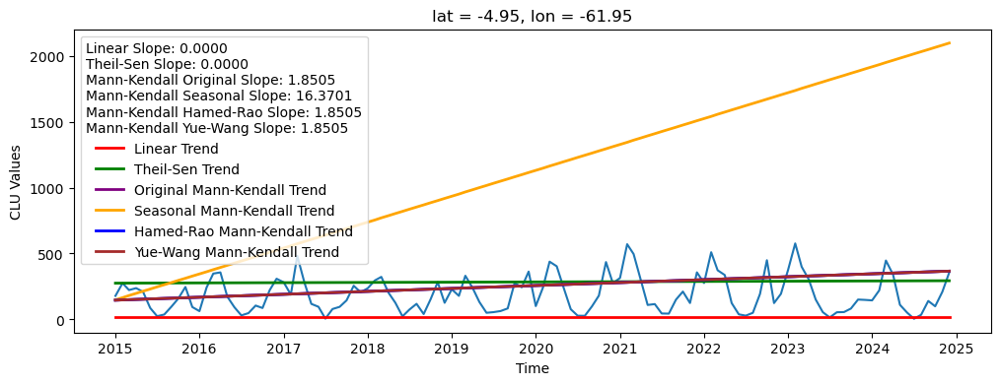

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12,4))
point_temporal_series['clu-values'].plot(ax=ax)
x_vals = np.arange(len(point_temporal_series['time']))
# Linear trend
ax.plot(point_temporal_series['time'].values, float(intercept.values) + float(linear_slope.values) * x_vals, color='red', label='Linear Trend', linewidth=2)
# Theil-Sen trend
ax.plot(point_temporal_series['time'].values, point_temporal_series['time'].astype('int64') * float(theil_sen_slope.values) + point_temporal_series['clu-values'].mean().values, color='green', label='Theil-Sen Trend', linewidth=2)
# Mann-Kendall trend (original)
mk_slope = original_mann_kendall['slope'].item()
mk_intercept = original_mann_kendall['intercept'].item()
ax.plot(point_temporal_series['time'].values, mk_intercept + mk_slope * x_vals, color='purple', label='Original Mann-Kendall Trend', linewidth=2)
mk_slope_seasonal = seasonal_mann_kendall['slope'].item()
mk_intercept_seasonal = seasonal_mann_kendall['intercept'].item()
ax.plot(point_temporal_series['time'].values, mk_intercept_seasonal + mk_slope_seasonal * x_vals, color='orange', label='Seasonal Mann-Kendall Trend', linewidth=2)
mk_slope_hamed_rao = hamed_rao_mann_kendall['slope'].item()
mk_intercept_hamed_rao = hamed_rao_mann_kendall['intercept'].item()
ax.plot(point_temporal_series['time'].values, mk_intercept_hamed_rao + mk_slope_hamed_rao * x_vals, color='blue', label='Hamed-Rao Mann-Kendall Trend', linewidth=2)
mk_slope_yue_wang = yue_wang_mann_kendall['slope'].item()
mk_intercept_yue_wang = yue_wang_mann_kendall['intercept'].item()
ax.plot(point_temporal_series['time'].values, mk_intercept_yue_wang + mk_slope_yue_wang * x_vals, color='brown', label='Yue-Wang Mann-Kendall Trend', linewidth=2)
ax.set_xlabel('Time')
ax.set_ylabel('CLU Values')
ax.legend(title=f'Linear Slope: {linear_slope.values:.4f}\nTheil-Sen Slope: {theil_sen_slope.values:.4f}\nMann-Kendall Original Slope: {mk_slope:.4f}\nMann-Kendall Seasonal Slope: {mk_slope_seasonal:.4f}\nMann-Kendall Hamed-Rao Slope: {mk_slope_hamed_rao:.4f}'f'\nMann-Kendall Yue-Wang Slope: {mk_slope_yue_wang:.4f}')
plt.show()

##### Acumulated Precipitation Maps ########

In [23]:
# Accumulated Precipitation Trend Analysis
gsmap_ds_v8_acum_precip = gsmap_ds_v8['clu-values']
imerg_ds_v7_acum_precip = imerg_ds_v7['clu-values']

if not os.path.exists("trends/gsmap_acum_precip_trend.nc"):
    gsmap_acum_precip_trend = compute(dask_mann_kendall(gsmap_ds_v8_acum_precip, test="original", alpha=0.05))
    gsmap_acum_precip_trend.to_netcdf("trends/gsmap_acum_precip_trend.nc")
else:
    gsmap_acum_precip_trend = xr.load_dataset("trends/gsmap_acum_precip_trend.nc")
if not os.path.exists("trends/imerg_acum_precip_trend.nc"):
    imerg_acum_precip_trend = compute(dask_mann_kendall(imerg_ds_v7_acum_precip, test="original", alpha=0.05))
    imerg_acum_precip_trend.to_netcdf("trends/imerg_acum_precip_trend.nc")
else:
    imerg_acum_precip_trend = xr.load_dataset("trends/imerg_acum_precip_trend.nc")

Text(0.0, 1.0, 'b) IMERG Final V07 Accumulated Precipitation Trend (2015-2024)')

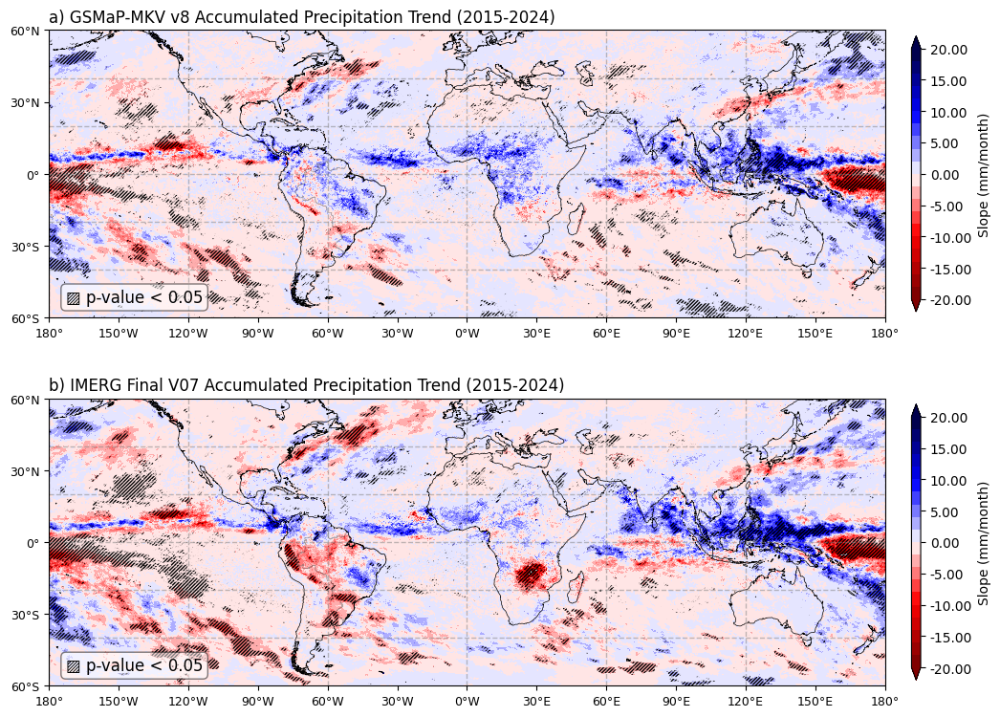

In [24]:
# Plot Select mask p-value where p < 0.05
gsmap_pvalue = gsmap_acum_precip_trend.p.where(gsmap_acum_precip_trend.p < 0.05)
imerg_pvalue = imerg_acum_precip_trend.p.where(imerg_acum_precip_trend.p < 0.05)

fig, axes = plt.subplots(2, 1, figsize=(12, 10), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.001, 'wspace': 0.13})
plots.map(gsmap_acum_precip_trend['slope'], sec_array=gsmap_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[0], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (mm/month)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=20, min_val=-20)
plots.map(imerg_acum_precip_trend['slope'] * 0.5, sec_array=imerg_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[1], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (mm/month)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=20, min_val=-20)
axes[0].set_title(f'a) {gsmap_name} Accumulated Precipitation Trend (2015-2024)', loc='left', fontsize=12)
axes[1].set_title(f'b) {imerg_name} Accumulated Precipitation Trend (2015-2024)', loc='left', fontsize=12)

In [25]:
# This function calculates the weighted mean values based on counts
def calc_weighted_mean(ds1, ds_count):
    mask_valid = (ds_count > 0) & np.isfinite(ds_count) & np.isfinite(ds1)
    ds_w = (ds1 / ds_count).where(mask_valid)
    return ds_w

In [26]:
# Fam Mean Precipitation Trend Analysis
gsmap_fam_mean_precip_trend = calc_weighted_mean(gsmap_ds_v8['fam-mean_values'], gsmap_ds_v8['fam-density'])
imerg_fam_mean_precip_trend = calc_weighted_mean(imerg_ds_v7['fam-mean_values'], imerg_ds_v7['fam-density'])
if not os.path.exists("trends/gsmap_fam_mean_mean_values_trend.nc"):
    gsmap_fam_mean_precip_trend_result = compute(dask_mann_kendall(gsmap_fam_mean_precip_trend, test="original", alpha=0.05))
    gsmap_fam_mean_precip_trend_result.to_netcdf("trends/gsmap_fam_mean_mean_values_trend.nc")
else:
    gsmap_fam_mean_precip_trend_result = xr.load_dataset("trends/gsmap_fam_mean_mean_values_trend.nc")
if not os.path.exists("trends/imerg_fam_mean_mean_values_trend.nc"):
    imerg_fam_mean_precip_trend_result = compute(dask_mann_kendall(imerg_fam_mean_precip_trend, test="original", alpha=0.05))
    imerg_fam_mean_precip_trend_result.to_netcdf("trends/imerg_fam_mean_mean_values_trend.nc")
else:
    imerg_fam_mean_precip_trend_result = xr.load_dataset("trends/imerg_fam_mean_mean_values_trend.nc")

Text(0.0, 1.0, 'b) IMERG Final V07 FAM Mean Precipitation Trend (2015-2024)')

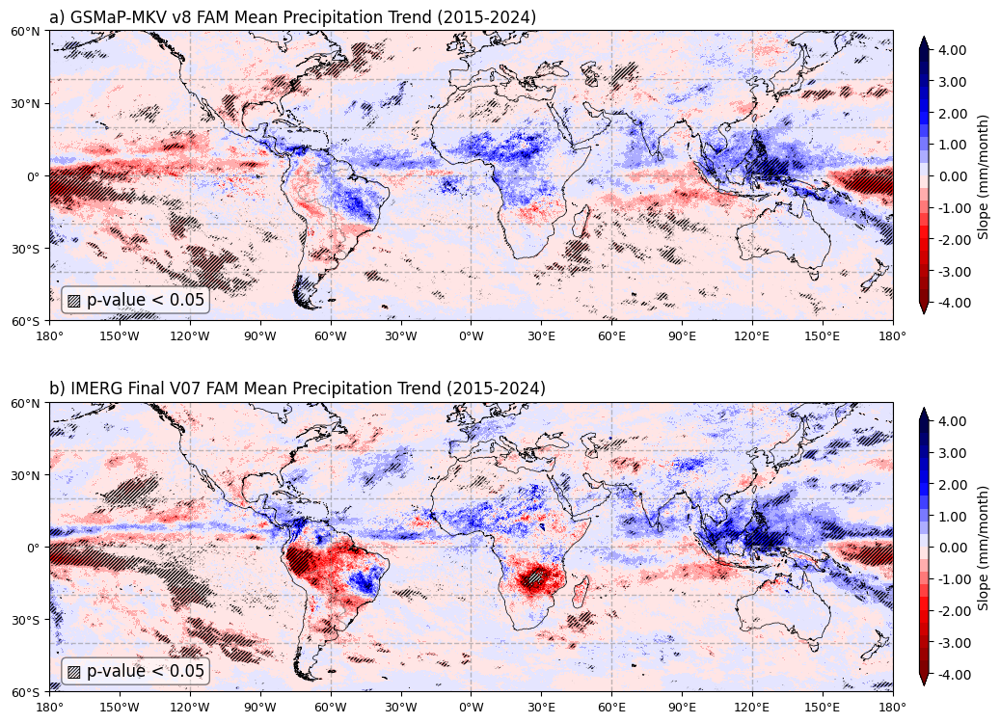

In [30]:
# Plot Select mask p-value where p < 0.05
gsmap_mean_precip_pvalue = gsmap_fam_mean_precip_trend_result.p.where(gsmap_fam_mean_precip_trend_result.p < 0.05)
imerg_mean_precip_pvalue = imerg_fam_mean_precip_trend_result.p.where(imerg_fam_mean_precip_trend_result.p < 0.05)

fig, axes = plt.subplots(2, 1, figsize=(12, 10), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.001, 'wspace': 0.13})
plots.map(gsmap_fam_mean_precip_trend_result['slope'], sec_array=gsmap_mean_precip_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[0], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (mm/month)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=4, min_val=-4)
plots.map(imerg_fam_mean_precip_trend_result['slope'], sec_array=imerg_mean_precip_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[1], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (mm/month)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=4, min_val=-4)
axes[0].set_title(f'a) {gsmap_name} FAM Mean Precipitation Trend (2015-2024)', loc='left', fontsize=12)
axes[1].set_title(f'b) {imerg_name} FAM Mean Precipitation Trend (2015-2024)', loc='left', fontsize=12)

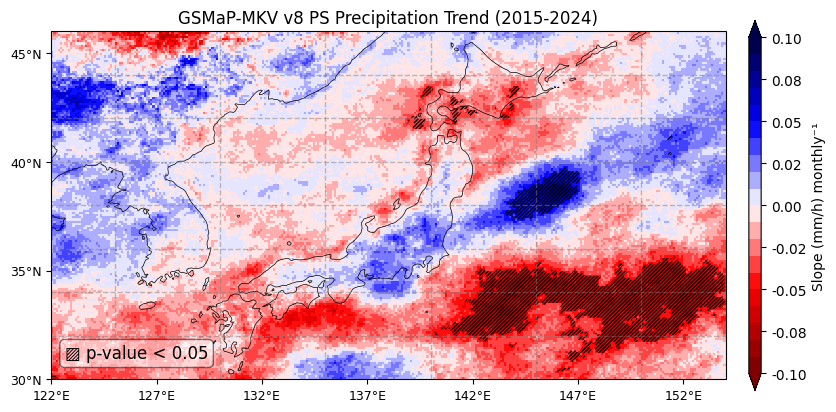

In [31]:
# Zoom gsmap_fam_mean_precip_trend_result over Japan
japan_extent = [122, 154, 30, 46]  # [lon_min, lon_max, lat_min, lat_max]
gsmap_fam_mean_precip_trend_japan = gsmap_fam_mean_precip_trend_result.sel(lon=slice(japan_extent[0], japan_extent[1]), lat=slice(japan_extent[2], japan_extent[3]))
gsmap_fam_mean_pvalue_japan = gsmap_mean_precip_pvalue.sel(lon=slice(japan_extent[0], japan_extent[1]), lat=slice(japan_extent[2], japan_extent[3]))
fig, axes = plt.subplots(1, 1, figsize=(10, 8), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()})
plots.map(gsmap_fam_mean_precip_trend_japan['slope'] / 10, sec_array=gsmap_fam_mean_pvalue_japan, sec_title='▨ p-value < 0.05', figsize=(10, 8), 
          title='', ylim=[30, 46], xlim=[122, 154], cmap_num=20, cmap='seismic_r', cbar_label='Slope (mm/h) monthly⁻¹', cbar_extend='both', cbar_fraction=0.1,  cbar_shrink=0.6, 
          cbar_format='%.2f', ax=axes, max_val=0.1)
axes.set_title(f'{gsmap_name} PS Precipitation Trend (2015-2024)', fontsize=12)
# increase number of x-ticks and y-ticks
ax = plt.gca()
ax.set_xticks(np.arange(japan_extent[0], japan_extent[1]+1, 5), crs=cartopy.crs.PlateCarree())
ax.set_yticks(np.arange(japan_extent[2], japan_extent[3]+1, 5), crs=cartopy.crs.PlateCarree());

In [72]:
# Fam Mean Precipitation Trend Analysis
gsmap_fam_mean_precip_trend = calc_weighted_mean(gsmap_ds_v8['fam-mean_values'], gsmap_ds_v8['fam-density'])
imerg_fam_mean_precip_trend = calc_weighted_mean(imerg_ds_v7['fam-mean_values'], imerg_ds_v7['fam-density'])
if not os.path.exists("trends/gsmap_fam_mean_trend.nc"):
    gsmap_fam_mean_precip_trend_result = compute(dask_mann_kendall(gsmap_fam_mean_precip_trend, test="original", alpha=0.05))
    gsmap_fam_mean_precip_trend_result.to_netcdf("trends/gsmap_fam_mean_trend.nc")
else:
    gsmap_fam_mean_precip_trend_result = xr.load_dataset("trends/gsmap_fam_mean_trend.nc")
if not os.path.exists("trends/imerg_fam_mean_trend.nc"):
    imerg_fam_mean_precip_trend_result = compute(dask_mann_kendall(imerg_fam_mean_precip_trend, test="original", alpha=0.05))
    imerg_fam_mean_precip_trend_result.to_netcdf("trends/imerg_fam_mean_trend.nc")
else:
    imerg_fam_mean_precip_trend_result = xr.load_dataset("trends/imerg_fam_mean_trend.nc")

Text(0.0, 1.0, 'b) IMERG Final V07 Fam (Weighted) Mean Precipitation Trend (2015-2024)')

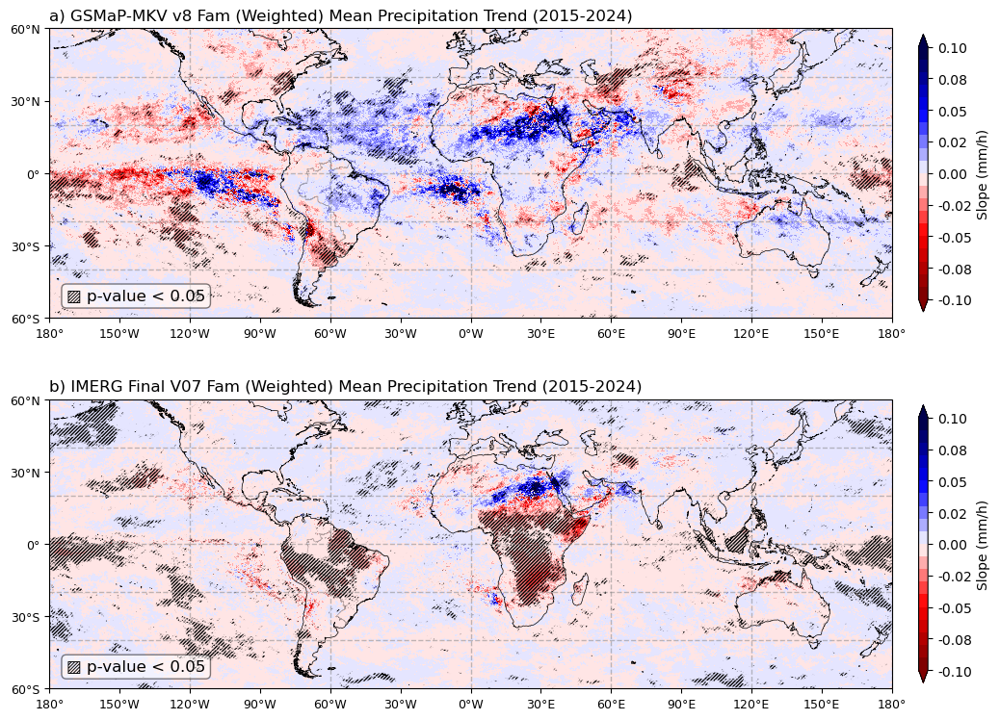

In [74]:
# Plot Select mask p-value where p < 0.05
gsmap_fam_mean_pvalue = gsmap_fam_mean_precip_trend_result.p.where(gsmap_fam_mean_precip_trend_result.p < 0.05)
imerg_fam_mean_pvalue = imerg_fam_mean_precip_trend_result.p.where(imerg_fam_mean_precip_trend_result.p < 0.05)

fig, axes = plt.subplots(2, 1, figsize=(12, 10), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.001, 'wspace': 0.13})
plots.map(gsmap_fam_mean_precip_trend_result['slope'], sec_array=gsmap_fam_mean_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[0], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (mm/h)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=0.1)
plots.map(imerg_fam_mean_precip_trend_result['slope'] * 0.5, sec_array=imerg_fam_mean_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[1], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (mm/h)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=0.1)
axes[0].set_title(f'a) {gsmap_name} Fam (Weighted) Mean Precipitation Trend (2015-2024)', loc='left', fontsize=12)
axes[1].set_title(f'b) {imerg_name} Fam (Weighted) Mean Precipitation Trend (2015-2024)', loc='left', fontsize=12)

In [38]:
# Fam Size Precipitation Trend Analysis
gsmap_fam_size_trend = calc_weighted_mean(gsmap_ds_v8['fam-size'], gsmap_ds_v8['fam-density'])
imerg_fam_size_trend = calc_weighted_mean(imerg_ds_v7['fam-size'], imerg_ds_v7['fam-density'])

if not os.path.exists("trends/gsmap_fam_size_trend.nc"):
    gsmap_fam_size_trend_result = compute(dask_mann_kendall(gsmap_fam_size_trend, test="original", alpha=0.05))
    gsmap_fam_size_trend_result.to_netcdf("trends/gsmap_fam_size_trend.nc")
else:
    gsmap_fam_size_trend_result = xr.load_dataset("trends/gsmap_fam_size_trend.nc")
if not os.path.exists("trends/imerg_fam_size_trend.nc"):
    imerg_fam_size_trend_result = compute(dask_mann_kendall(imerg_fam_size_trend, test="original", alpha=0.05))
    imerg_fam_size_trend_result.to_netcdf("trends/imerg_fam_size_trend.nc")
else:
    imerg_fam_size_trend_result = xr.load_dataset("trends/imerg_fam_size_trend.nc")

Text(0.0, 1.0, 'b) IMERG Final V07 Fam Size Trend (2015-2024)')

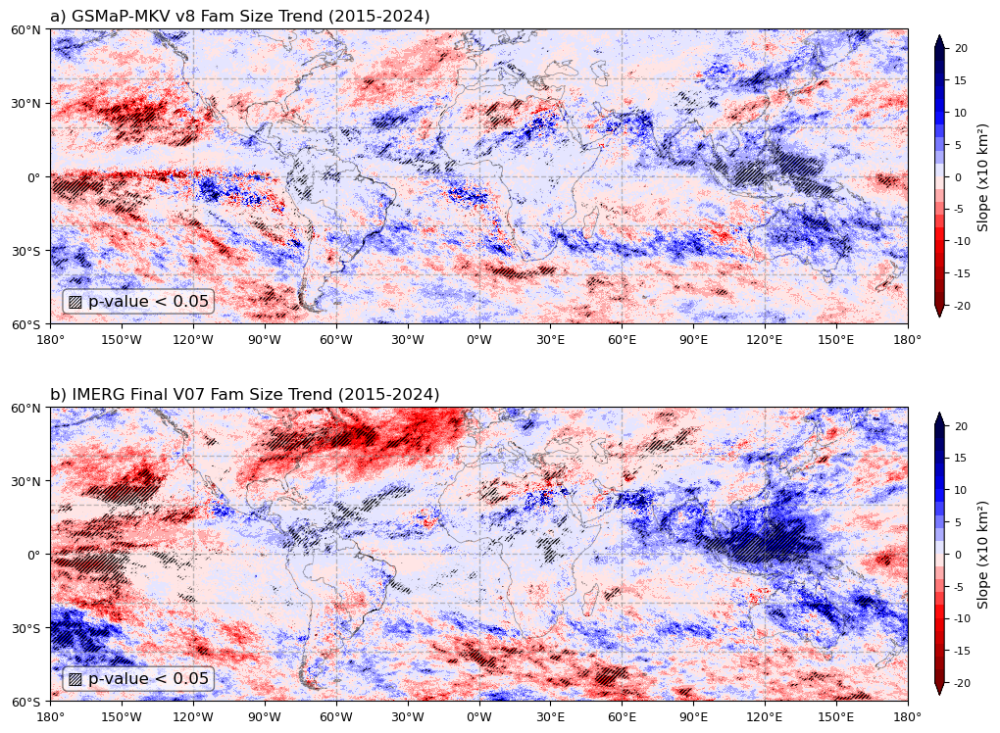

In [49]:
# Plot Select mask p-value where p < 0.05
gsmap_fam_size_pvalue = gsmap_fam_size_trend_result.p.where(gsmap_fam_size_trend_result.p < 0.05)
imerg_fam_size_pvalue = imerg_fam_size_trend_result.p.where(imerg_fam_size_trend_result.p < 0.05)

fig, axes = plt.subplots(2, 1, figsize=(12, 10), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.001, 'wspace': 0.13})
plots.map(gsmap_fam_size_trend_result['slope']  / (0.1 * 0.1), sec_array=gsmap_fam_size_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[0], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (x10 km²)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, max_val = 20000, cbar_ticks_notation_resumed=True)
plots.map(imerg_fam_size_trend_result['slope'] / (0.1 * 0.1), sec_array=imerg_fam_size_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[1], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (x10 km²)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, max_val = 20000, cbar_ticks_notation_resumed=True)
axes[0].set_title(f'a) {gsmap_name} Fam Size Trend (2015-2024)', loc='left', fontsize=12)
axes[1].set_title(f'b) {imerg_name} Fam Size Trend (2015-2024)', loc='left', fontsize=12)

In [71]:
# Fam Duration Trend Analysis
gsmap_fam_duration_trend = calc_weighted_mean(gsmap_ds_v8['fam-duration'], gsmap_ds_v8['fam-density'])
imerg_fam_duration_trend = calc_weighted_mean(imerg_ds_v7['fam-duration'], imerg_ds_v7['fam-density'])

if not os.path.exists("trends/imerg_fam_duration_trend.nc"):
    gsmap_fam_duration_trend_result = compute(dask_mann_kendall(gsmap_fam_duration_trend, test="original", alpha=0.05))
    gsmap_fam_duration_trend_result.to_netcdf("trends/gsmap_fam_duration_trend.nc")
else:
    gsmap_fam_duration_trend_result = xr.load_dataset("trends/gsmap_fam_duration_trend.nc")
if not os.path.exists("trends/imerg_fam_duration_trend.nc"):
    imerg_fam_duration_trend_result = compute(dask_mann_kendall(imerg_fam_duration_trend, test="original", alpha=0.05))
    imerg_fam_duration_trend_result.to_netcdf("trends/imerg_fam_duration_trend.nc")
else:
    imerg_fam_duration_trend_result = xr.load_dataset("trends/imerg_fam_duration_trend.nc")

Text(0.0, 1.0, 'b) IMERG Final V07 Fam Duration Trend (2015-2024)')

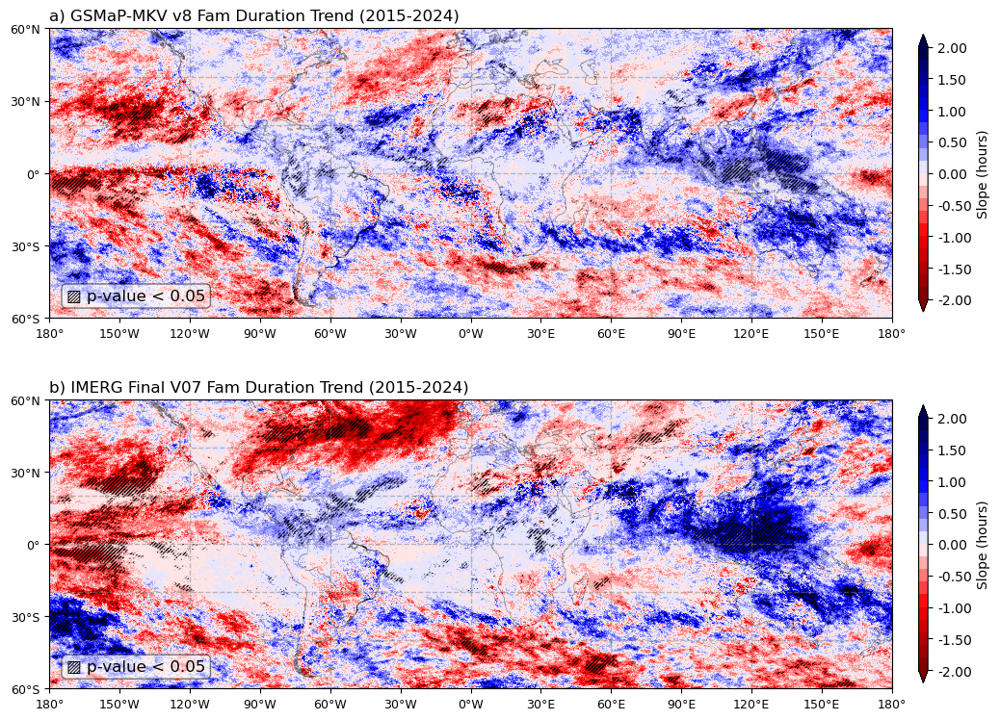

In [56]:
# Plot Select mask p-value where p < 0.05
gsmap_fam_size_pvalue = gsmap_fam_size_trend_result.p.where(gsmap_fam_size_trend_result.p < 0.05)
imerg_fam_size_pvalue = imerg_fam_size_trend_result.p.where(imerg_fam_size_trend_result.p < 0.05)

fig, axes = plt.subplots(2, 1, figsize=(12, 10), dpi=100, subplot_kw={'projection': cartopy.crs.PlateCarree()}, gridspec_kw={'hspace': 0.001, 'wspace': 0.13})
plots.map(gsmap_fam_size_trend_result['slope'] * (1 / 60) , sec_array=gsmap_fam_size_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[0], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (hours)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=2)
plots.map(imerg_fam_size_trend_result['slope'] * (1 / 60), sec_array=imerg_fam_size_pvalue, sec_title='▨ p-value < 0.05', figsize=(12, 8), ax=axes[1], title='', ylim=[-60, 60], cmap_num=20, cmap='seismic_r',
cbar_label='Slope (hours)', cbar_extend='both', cbar_fraction=0.03,  cbar_shrink=0.75, cbar_format='%.2f', max_val=2)
axes[0].set_title(f'a) {gsmap_name} Fam Duration Trend (2015-2024)', loc='left', fontsize=12)
axes[1].set_title(f'b) {imerg_name} Fam Duration Trend (2015-2024)', loc='left', fontsize=12)

In [67]:
import geopandas as gpd

url = "https://naturalearth.s3.amazonaws.com/10m_cultural/ne_10m_admin_0_countries.zip"
countries = gpd.read_file(f"zip+https://{url.split('https://')[1]}")

In [68]:
# Select Brazil
brazil_shape = countries[countries['ADMIN'] == 'Brazil']
japan_shape = countries[countries['ADMIN'] == 'Japan']

In [79]:
def calc_mean_series(ds, shape):
    ds = ds.rio.write_crs("EPSG:4326").rename({"lat": "y", "lon": "x"}).rio.clip(shape.geometry, shape.crs)
    ds_series = compute(ds.mean(dim=["x", "y"]))
    return ds_series

In [ ]:
# Calculuate mean series of brazil_duration_series
brazil_duration_series_mean = calc_mean_series(gsmap_fam_duration_trend, brazil_shape)
japan_duration_series_mean = calc_mean_series(gsmap_fam_duration_trend, japan_shape)

In [85]:
# Calculate slope using mann-kendall
brazil_duration_trend = dask_mann_kendall(brazil_duration_series_mean, test="original", alpha=0.05)
japan_duration_trend = dask_mann_kendall(japan_duration_series_mean, test="original", alpha=0.05)

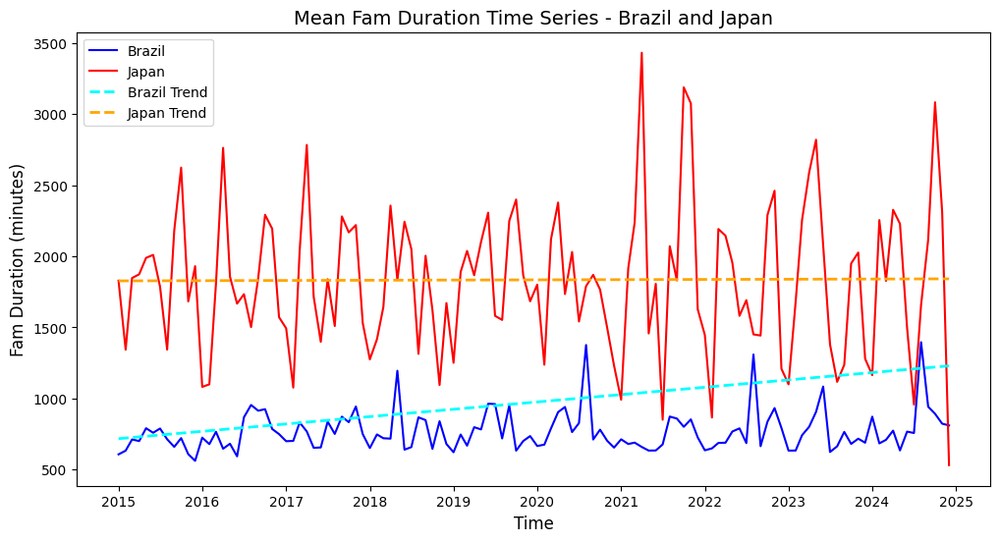

In [87]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
brazil_duration_series_mean.plot(ax=ax, label='Brazil', color='blue')
japan_duration_series_mean.plot(ax=ax, label='Japan', color='red')
# Add trend lines
brazil_slope = brazil_duration_trend.compute()['slope'].item()
brazil_intercept = brazil_duration_trend.compute()['intercept'].item()
japan_slope = japan_duration_trend.compute()['slope'].item()
japan_intercept = japan_duration_trend.compute()['intercept'].item()
x_vals = np.arange(len(brazil_duration_series_mean['time']))
ax.plot(brazil_duration_series_mean['time'].values, brazil_intercept + brazil_slope * x_vals, color='cyan', linestyle='--', label='Brazil Trend', linewidth=2)
ax.plot(japan_duration_series_mean['time'].values, japan_intercept + japan_slope * x_vals, color='orange', linestyle='--', label='Japan Trend', linewidth=2)
ax.set_title('Mean Fam Duration Time Series - Brazil and Japan', fontsize=14)
ax.set_xlabel('Time', fontsize=12)
ax.set_ylabel('Fam Duration (minutes)', fontsize=12)
ax.legend()
plt.show()